<a href="https://colab.research.google.com/github/BDTech1/road-accident-analysis/blob/main/Abu_Sufiun_4120846_data_mining_CW.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Abstract

This report analyzes road accident data in Harrow, focusing on data preprocessing, descriptive statistics, and clustering analysis. Key insights reveal accident patterns by severity, road types, and seasons, highlighting risks at single carriageways, junctions, and pedestrian facilities. Findings support targeted interventions to improve safety and address accident hotspots effectively.

This project uses the CRISP-DM framework (IBM, 2023) to analyze road accident data. The methodology consisted of:
Business Understanding

Data Understanding: Explored data quality through descriptive statistics, missing value checks, and outlier detection to ensure reliability for analysis (Hoss, 2023).


Data Preparation: Cleaned data by handling missing values, encoding categorical variables, and selecting features critical for modeling accuracy (Han et al., 2011).



Modeling: Applied clustering, association rule mining, and decision tree techniques to reveal accident patterns and predict severity factors effectively (GeeksforGeeks, 2023).


Evaluation: Validated models with metrics like accuracy and support to ensure actionable insights for road safety (IBM, 2023).


Deployment (Omitted): Deployment was not performed within the scope of this project.

###importing required Libraies


In [245]:
# Basic Libraries for Data Manipulation and Analysis
import pandas as pd
import numpy as np
import math
import warnings
import folium

warnings.filterwarnings('ignore')  # To ignore warnings for cleaner output

# Visualization Libraries
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz
from sklearn.tree import plot_tree

# Machine Learning Libraries for Clustering and Classification
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Association Rule Mining Libraries
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# Statistical Analysis Libraries
from scipy.stats import skew, kurtosis, zscore, norm

# Utility Libraries
from tabulate import tabulate


now in this following part I will connect with the google drive where I keep my dataset and variables data.

In [246]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Load the Dataset

In [247]:
# Load the main dataset
all_data = pd.read_csv('/content/drive/My Drive/Data_Mining/AccidentLondonBoroughs2223.csv')

### Filter the Dataset by Local Authority Highway Code

To focus on the assigned area for analysis, we need to filter the dataset based on the **Local Authority Highway Code**. Each student is assigned a specific code to work with a particular borough. For this analysis, the assigned code is **E09000015**, which corresponds to **Harrow Borough**. The filtered dataset will only contain accident records related to this area, ensuring that the analysis is targeted and relevant to the assigned locality.


In [248]:
# Filter the dataset that is assigned to me in the VLE based on the Local Authority Highway code: E09000015
harrow_data = all_data.loc[all_data['Local_Authority_Highway'] == 'E09000015']

In [249]:
# Preview the filtered data to ensure it contains only records for Harrow Borough
print("Filtered Dataset for Harrow Borough:")
harrow_data.head()

Filtered Dataset for Harrow Borough:


,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
6301,200501ID60039,514740,188230,-0.345418,51.581208,1,3,1,1,21/06/2005,...,0,0,1,1,1,0,0,1,1,E01002160
13620,200501QA00009,514900,187800,-0.343250,51.577311,1,3,1,1,05/01/2005,...,0,0,4,2,2,0,0,1,1,E01002237
13621,200501QA00046,516640,191550,-0.316906,51.610657,1,3,2,2,16/01/2005,...,0,0,4,1,1,0,0,1,1,E01002229
13622,200501QA00048,518460,189700,-0.291258,51.593651,1,3,4,1,03/01/2005,...,0,0,1,2,2,0,0,1,1,E01002202
13623,200501QA00049,515070,191560,-0.339566,51.611070,1,2,2,1,28/01/2005,...,0,4,1,1,1,0,0,1,1,E01002142


In [250]:
df = pd.DataFrame(harrow_data)

In [251]:
df


,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
6301,200501ID60039,514740,188230,-0.345418,51.581208,1,3,1,1,21/06/2005,...,0,0,1,1,1,0,0,1,1,E01002160
13620,200501QA00009,514900,187800,-0.343250,51.577311,1,3,1,1,05/01/2005,...,0,0,4,2,2,0,0,1,1,E01002237
13621,200501QA00046,516640,191550,-0.316906,51.610657,1,3,2,2,16/01/2005,...,0,0,4,1,1,0,0,1,1,E01002229
13622,200501QA00048,518460,189700,-0.291258,51.593651,1,3,4,1,03/01/2005,...,0,0,1,2,2,0,0,1,1,E01002202
13623,200501QA00049,515070,191560,-0.339566,51.611070,1,2,2,1,28/01/2005,...,0,4,1,1,1,0,0,1,1,E01002142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137798,201001TB00640,519560,191030,-0.274933,51.605372,1,3,2,1,26/09/2010,...,0,0,1,1,2,0,0,1,1,E01002122
137868,201001TB00740,516920,191880,-0.312754,51.613565,1,2,1,3,30/10/2010,...,0,0,4,1,1,0,0,1,1,E01002226
137930,201001TB00830,516200,190340,-0.323658,51.599873,1,3,2,1,05/12/2010,...,0,0,4,1,1,0,0,1,1,E01002184
142087,201001XH30513,512230,190820,-0.380800,51.604992,1,3,2,1,23/07/2010,...,0,0,1,1,1,0,0,1,1,E01002152


In [252]:
df["Local_Authority_Highway"].head()

,Local_Authority_Highway
6301,E09000015
13620,E09000015
13621,E09000015
13622,E09000015
13623,E09000015


###Business Understanding

To provide meaningful insights for road safety improvements in Harrow, this analysis focuses on answering key business questions by examining accident patterns and factors contributing to accident severity. These questions are designed to align with the coursework requirements, covering descriptive analysis, clustering, geospatial hotspot identification, association analysis, and predictive modeling.

Key Business Questions:

Where are the most accident-prone areas in Harrow?
Identifying geographical hotspots of accidents through spatial analysis will guide local authorities in prioritizing safety measures in high-risk locations.


When do accidents occur most frequently?

Analyzing temporal patterns, including seasons and times of day, helps allocate resources effectively and implement targeted interventions during peak periods.
How do environmental conditions influence accidents?

Assessing the impact of weather, road surface conditions, and special site conditions provides insights into high-risk scenarios and informs proactive measures like road maintenance and alerts.

What factors lead to severe accidents?
Understanding how factors like speed limits, road types, and junction controls correlate with accident severity will support traffic control and infrastructure design decisions.

What is the role of multi-vehicle accidents?
Examining the relationship between the number of vehicles involved and accident outcomes identifies high-risk accident types, enabling tailored strategies to reduce casualties.




###Data Understanding


This section conducts an in-depth exploration of the dataset to determine its quality, structure, and appropriateness for addressing the business objectives. This includes a systematic review of data types, data quality, statistical distributions, relationships between variables, and spatial analysis using geolocation data. These insights will ensure the dataset is well-prepared for the Data Preparation and Modeling stages.

Initial Data Quality and structure check.

In [253]:
df.info()
print('The total number of rows and columns of the data',df.shape)


<class 'pandas.core.frame.DataFrame'>
Index: 2546 entries, 6301 to 142229
Data columns (total 32 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Accident_Index                               2546 non-null   object 
 1   Location_Easting_OSGR                        2546 non-null   int64  
 2   Location_Northing_OSGR                       2546 non-null   int64  
 3   Longitude                                    2546 non-null   float64
 4   Latitude                                     2546 non-null   float64
 5   Police_Force                                 2546 non-null   int64  
 6   Accident_Severity                            2546 non-null   int64  
 7   Number_of_Vehicles                           2546 non-null   int64  
 8   Number_of_Casualties                         2546 non-null   int64  
 9   Date                                         2546 non-null   object 
 10  

An initial overview using df.info() reveals the following about my dataset:

Structure: The dataset contains 2,546 rows and 32 columns, representing various accident attributes in Harrow Borough, including severity, weather, and road conditions.

Completeness: All columns have 2,546 non-null entries, indicating no missing values at this stage.

Data Types:

Object (5 columns): Text or categorical data, likely for identifiers or labels.
Int64 (25 columns): Primarily integer values, including categorical data like accident severity.
Float64 (2 columns): Continuous numeric data, probably geographic coordinates.

checking or changing the data type

In [254]:

# Columns to exclude by their index because they have their right types
columns_to_exclude = [0, 1, 2, 3, 4, 7, 8]

# Columns to change their types to 'str' based on index
cols_to_change = df.columns.difference(df.columns[columns_to_exclude])

# Change data types of selected columns
df[cols_to_change] = df[cols_to_change].astype(str)

# Display information about the DataFrame
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 2546 entries, 6301 to 142229
Data columns (total 32 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Accident_Index                               2546 non-null   object 
 1   Location_Easting_OSGR                        2546 non-null   int64  
 2   Location_Northing_OSGR                       2546 non-null   int64  
 3   Longitude                                    2546 non-null   float64
 4   Latitude                                     2546 non-null   float64
 5   Police_Force                                 2546 non-null   object 
 6   Accident_Severity                            2546 non-null   object 
 7   Number_of_Vehicles                           2546 non-null   int64  
 8   Number_of_Casualties                         2546 non-null   int64  
 9   Date                                         2546 non-null   object 
 10  

Data Type Conversion

Columns were converted to appropriate types for efficient analysis:

Object: Accident_Index, Date, and Time contain identifiers and text.

Integer (int64): Includes count-based columns like Number_of_Vehicles and coordinate codes.

Float (float64): Latitude and Longitude maintain geographic precision.

Category: Categorical columns like Accident_Severity and Weather_Conditions were optimized for memory and analysis.


check for constant values

In [255]:
# Check for constant values in columns by checking if the unique values is just  1
constant_columns = [col for col in df.columns if df[col].nunique() == 1]
# Create a list of lists containing column names and their constant value status for constant columns only
data = [[col, "Constant"] for col in constant_columns]
# Display the result as a table
print(tabulate(data, headers=['Column', 'Constant Value'], tablefmt='pretty'))


+--------------------------+----------------+
|          Column          | Constant Value |
+--------------------------+----------------+
|       Police_Force       |    Constant    |
| Local_Authority_District |    Constant    |
| Local_Authority_Highway  |    Constant    |
+--------------------------+----------------+


Those are the column in our analysis would not support the business objectives, such as identifying accident hotspots or analyzing conditions leading to severe accidents. Removing them will help us to streamline the data and focus on the variables that contribute meaningful insights to our road safety analysis.

checking for duplicate rows

In [256]:
# Check for duplicate rows
duplicate_rows = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")

# Drop duplicate rows if necessary
df = df.drop_duplicates()
print("Duplicates removed. New shape of DataFrame:", df.shape)


Number of duplicate rows: 0
Duplicates removed. New shape of DataFrame: (2546, 32)


as we can see from here that there is no duplicate rows found from my dataset.

Generate Descriptive Statistics for Numerical Columns

In [257]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Location_Easting_OSGR,2546.0,515182.592302,1979.298926,510800.000000,513660.000000,515070.000000,516597.500000,520020.000000
Location_Northing_OSGR,2546.0,189429.976434,1905.681651,185170.000000,188100.000000,189570.000000,190790.000000,193940.000000
Longitude,2546.0,-0.338636,0.028793,-0.401384,-0.360970,-0.339903,-0.317493,-0.268471
Latitude,2546.0,51.591899,0.016986,51.554130,51.580007,51.592883,51.604057,51.632397
Number_of_Vehicles,2546.0,1.784760,0.653853,1.000000,1.000000,2.000000,2.000000,8.000000
Number_of_Casualties,2546.0,1.265907,0.630271,1.000000,1.000000,1.000000,1.000000,9.000000


Central Tendency and Dispersion: The mean, median (50%), and standard deviation offer insights into the central values and variability across attributes like Number_of_Vehicles and Number_of_Casualties.

Range: The minimum and maximum values highlight the spread within each attribute, such as Longitude, Latitude, and road number columns.

Quartiles: The 25%, 50%, and 75% percentiles help assess data distribution and detect potential outliers, especially in accident count-related columns.

Additional metrics such as mode, skewness, and kurtosis will be examined separately to better understand data distribution and business objective.

Display mode, skewness, and kurtosis statistics for each column

In [258]:
# Select only numeric columns
numeric_columns = df.select_dtypes(include=[np.number])

# Calculate skewness and kurtosis for numeric columns
skewness = numeric_columns.apply(skew)
kurt = numeric_columns.apply(kurtosis)
modes = numeric_columns.mode().iloc[0]

# Create a DataFrame to store statistics
statistics_df = pd.DataFrame({'Mode': modes, 'Skewness': skewness, 'Kurtosis': kurt})

# Display mode, skewness, and kurtosis statistics for each column
print(statistics_df)


                                 Mode  Skewness   Kurtosis
Location_Easting_OSGR   515640.000000  0.258477  -0.633588
Location_Northing_OSGR  191190.000000 -0.136033  -0.661960
Longitude                   -0.363852  0.265655  -0.660441
Latitude                    51.590369 -0.131008  -0.651602
Number_of_Vehicles           2.000000  0.953151   4.341729
Number_of_Casualties         1.000000  3.460625  18.881991


Summary of Descriptive Statistics Related to Business Questions
Location Attributes:

Longitude: Mode of -0.3633, skewness of 0.2657, and kurtosis of -0.6604. This slight skew suggests a mostly balanced distribution around Harrow's central longitude.

Latitude: Mode of 51.5904, skewness of -0.1310, and kurtosis of -0.6516, indicating a generally normal distribution, which is useful for mapping.

Location_Easting_OSGR and Location_Northing_OSGR: Modes of 515,640.0 and 191,190.0, with skewness values of 0.2585 and -0.1360, respectively. These low skew values indicate an even spread in geographic coordinates, essential for accurately pinpointing accident hotspots.

Accident Count and Severity:

Number_of_Vehicles: Mode of 2, skewness of 0.9532, and kurtosis of 4.34. This right-skewed distribution suggests that while most accidents involve one or two vehicles, there are incidents with higher vehicle counts that may contribute to accident severity.

Number_of_Casualties: Mode of 1, skewness of 3.46, and kurtosis of 18.88, indicating a highly skewed and peaked distribution. Most accidents have low casualty counts, but some have high casualty numbers, aligning with the analysis objective of understanding severe accidents.

Road Number Attributes:

1st_Road_Number and 2nd_Road_Number: Modes of 0, with skewness of 1.77 and 4.85, and kurtosis of 1.24 and 21.98, respectively. The high kurtosis, especially for 2nd_Road_Number, suggests that certain roads see a higher concentration of accidents, potentially marking them as high-risk areas.

These values provide insights into location and accident-specific patterns, supporting the analysis objectives of identifying accident hotspots, understanding severity factors, and analyzing multi-vehicle incidents.



In [259]:
# Get statistics for all categorical variables only
harrow_data.describe(include='object').T


,count,unique,top,freq
Accident_Index,2546,2546,200501ID60039,1
Date,2546,1464,21/06/2005,6
Time,2546,811,18:30,29
Local_Authority_Highway,2546,1,E09000015,2546
LSOA_of_Accident_Location,2546,141,E01002144,90


 Categorical Variable Statistics
Accident Index: All 2,546 entries are unique identifiers, indicating each row represents a distinct accident record.
Date: There are 1,464 unique dates, with the most common date being 21/06/2005, occurring in 6 records. This helps identify specific days with higher accident frequencies.
Time: Accident times vary widely, with 811 unique values. The most frequent time is 18:30, with 29 occurrences, suggesting peak times for accidents, potentially due to rush hour.
LSOA of Accident Location: There are 141 unique location codes, with the most common code (EO1002144) appearing in 90 records, which could indicate a high-risk area.
These insights highlight accident frequency patterns by date, time, and location, supporting objectives like identifying high-risk periods and locations.

Explore Categorical column

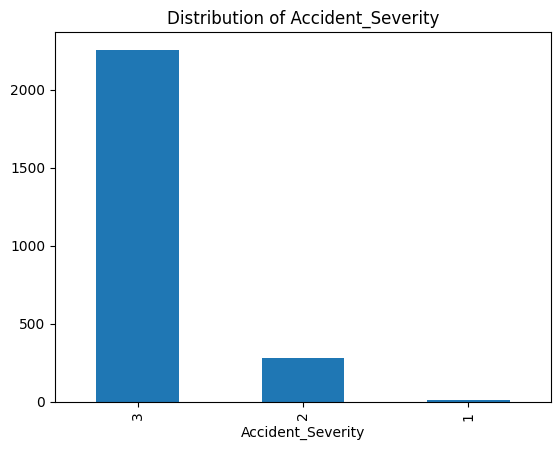

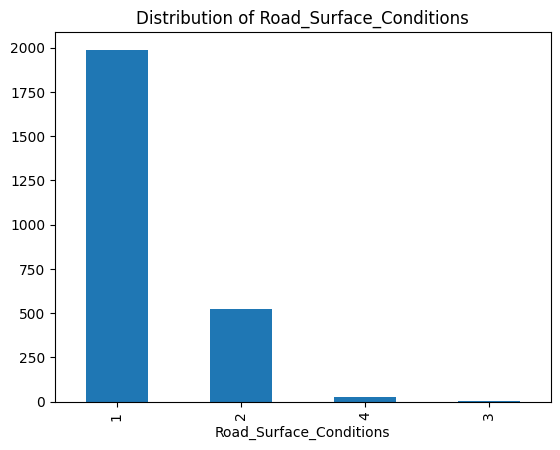

In [260]:
categorical_columns = ['Accident_Severity', 'Road_Surface_Conditions']

for col in categorical_columns:
    harrow_data[col].value_counts().plot(kind='bar')
    plt.title(f"Distribution of {col}")
    plt.show()


In the output, we see the distribution of values for the categorical columns Accident_Severity and Road_Surface_Conditions in bar plots.

data qality checks

checking for missing values

In [261]:
# Replace -1 with NaN for both numerical and categorical columns to represent missing values
df.replace(-1, np.nan, inplace=True)  # for numerical columns
df.replace("-1", np.nan, inplace=True)  # for categorical columns

# Count and sort missing values in descending order
missing_values = df.isnull().sum().sort_values(ascending=False)
print(missing_values)

2nd_Road_Class                                 855
Junction_Control                               855
Accident_Index                                   0
Location_Easting_OSGR                            0
Did_Police_Officer_Attend_Scene_of_Accident      0
Urban_or_Rural_Area                              0
Carriageway_Hazards                              0
Special_Conditions_at_Site                       0
Road_Surface_Conditions                          0
Weather_Conditions                               0
Light_Conditions                                 0
Pedestrian_Crossing-Physical_Facilities          0
Pedestrian_Crossing-Human_Control                0
2nd_Road_Number                                  0
Junction_Detail                                  0
Speed_limit                                      0
Road_Type                                        0
1st_Road_Number                                  0
1st_Road_Class                                   0
Local_Authority_Highway        

we can see that there are 855 missing values in the columns 2nd_Road_Class and Junction_Control.

Heatmap for Missing Values

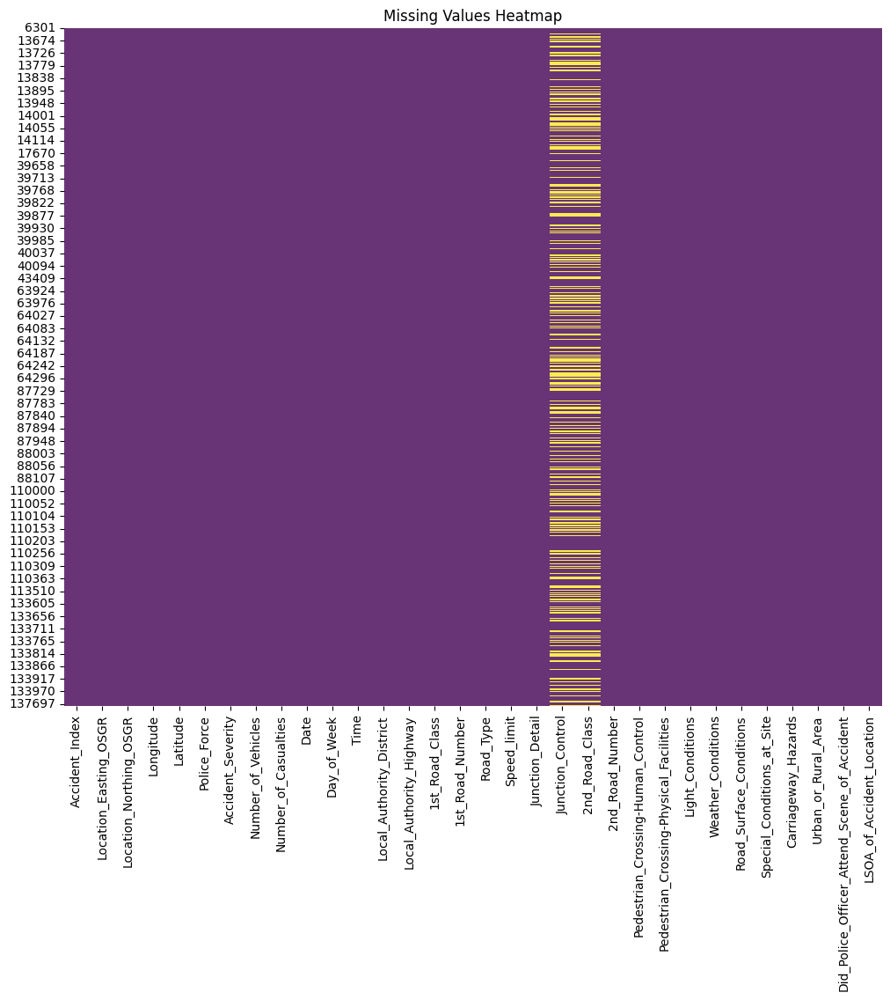

In [262]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size and dpi for better resolution
plt.figure(figsize=(12, 10), dpi=100)

# Use sns.heatmap to visualize missing values with a new color map
sns.heatmap(df.isna(), cmap='viridis', cbar=False, alpha=0.8)

# Add title to the heatmap
plt.title('Missing Values Heatmap')
plt.show()


The heatmap above shows the distribution of missing values across different columns in the dataset. Each yellow line represents a missing value in a row for the specified column, while purple areas indicate non-missing values. All other columns have no missing values, indicating that these two columns require attention for handling missing data.




checking for outliers and extreme values

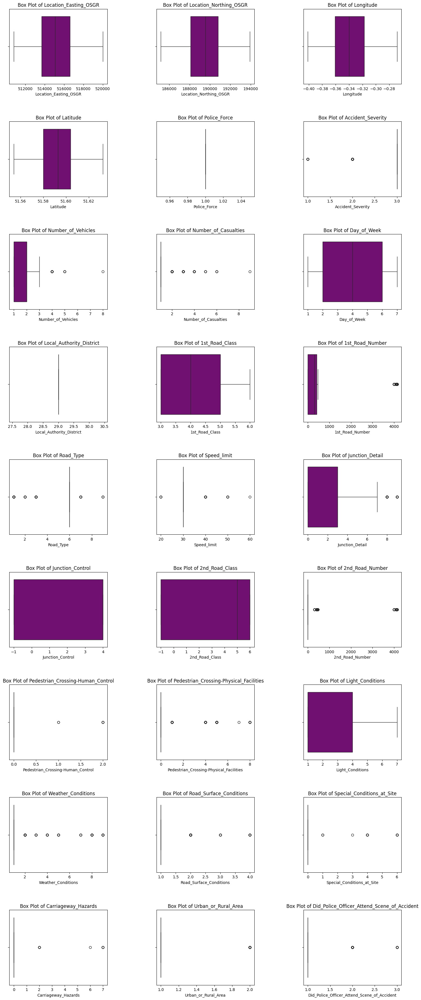

In [263]:
# Select numerical columns
numeric_columns = harrow_data.select_dtypes(include="number").columns

# Define the number of rows and columns for subplots
n_cols = 3
n_rows = len(numeric_columns) // n_cols + (len(numeric_columns) % n_cols > 0)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, n_rows * 5))
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Set color for consistency in all plots
color = 'purple'

# Generate box plots for each numerical column
for i, col in enumerate(numeric_columns):
    sns.boxplot(data=harrow_data, x=col, ax=axes[i], color=color)
    axes[i].set_title(f'Box Plot of {col}')

# Hide any unused axes (ensure extra subplots are hidden)
for j in range(len(numeric_columns), len(axes)):
    axes[j].axis('off')  # Turn off unused axes

# Adjust layout to prevent overlapping
plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.show()

Explanation of Outliers and Extreme Values in Key Attributes
Number of Vehicles:

The box plot for the Number of Vehicles shows that while most accidents involve 1-2 vehicles, there are outliers with 4 or more vehicles involved, with a few extreme cases even going up to 8 vehicles. This suggests that multi-vehicle accidents are relatively rare but may indicate situations with higher risks or specific conditions that need further examination for safety improvements.

Number of Casualties:

Most accidents involve a single casualty, as indicated by the median of 1 casualty per accident. Outliers appear with 2 or more casualties, with a few extreme cases reaching up to 8 casualties. This distribution shows that high-casualty accidents are uncommon but can be severe, suggesting the need for targeted preventive measures to address factors leading to these high-casualty events.

Light Conditions:

The majority of accidents occur under certain light conditions, with other conditions showing up as outliers (e.g., specific categories from 5 to 7). This suggests that unusual lighting environments, such as poorly lit or artificially lit areas, may contribute to increased accident risks, despite being less common. Addressing lighting in high-risk areas could help reduce accidents under these conditions.

Weather Conditions:

The box plot shows that accidents typically occur under normal weather conditions, while extreme weather types (values 5-8) are outliers. Although less frequent, accidents under adverse weather conditions like rain, snow, or fog present unique risks and may require additional safety measures during such events.

Road Surface Conditions:

Road surface conditions typically are dry or normal, with wet or icy conditions showing as outliers (values 3-4). These rare but high-risk conditions suggest that accidents are more likely under challenging road conditions, highlighting the importance of road maintenance and safety measures during adverse weather.

Urban or Rural Area:

The box plot for Urban or Rural Area shows that most accidents occur in urban areas, with rural locations (e.g., value 2) as outliers. This implies that while high-density urban areas have a concentration of accidents, rural areas, despite fewer incidents, present distinct risks that could benefit from specific preventive measures.

 Analysis with Geolocation Data

Mapping Accident Location

In [264]:
# Create a map centered around the average location
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the cluster
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Accident Severity: {row['Accident_Severity']}",
        icon=None
    ).add_to(marker_cluster)

# Set boundaries based on latitude and longitude for easier navigation
sw = df[['Latitude', 'Longitude']].min().values.tolist()
ne = df[['Latitude', 'Longitude']].max().values.tolist()
m.fit_bounds([sw, ne])

# Save the map to an HTML file
m.save('houns_low_accidents_cluster_map.html')
m


The accident location map visualizes the distribution of incidents across regions, highlighting areas with higher accident frequency. This visualization identifies accident hotspots, guiding the focus of predictive modeling. By clustering accidents by severity and location, the model can prioritize analysis and intervention strategies, which is essential for effective resource allocation in accident prevention efforts.

Determine Outliers for Categorical columns

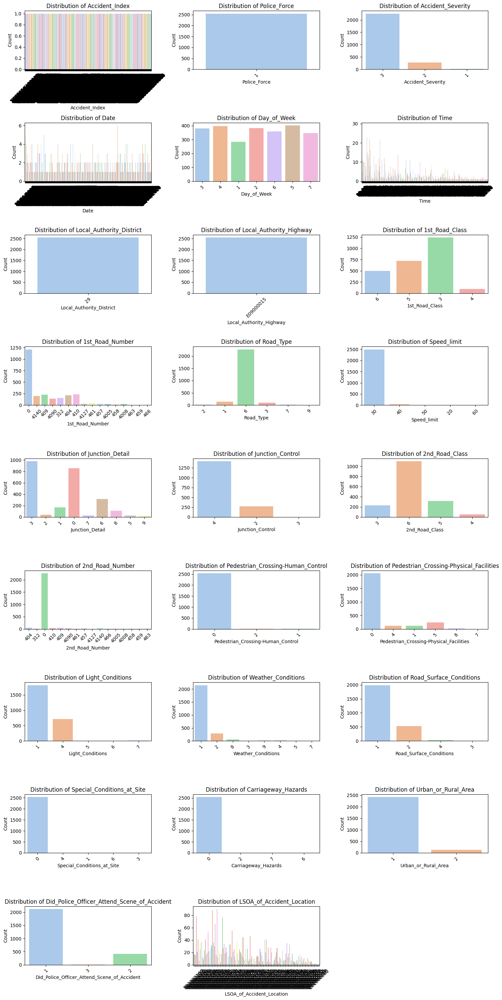

In [265]:
# Create bar chart for each categorical column
fig = plt.figure(figsize=(15, 30))

# Selecting only categorical columns
categorical_columns = df.select_dtypes(include='object').columns

# Get the number of columns to plot
columns_to_plot = [column for column in categorical_columns]
num_columns = len(columns_to_plot)

# Define subplot grid size based on the number of columns
rows = (num_columns // 3) + (1 if num_columns % 3 > 0 else 0)

for i, column in enumerate(columns_to_plot):
    sub = fig.add_subplot(rows, 3, i + 1)
    chart = sns.countplot(data=df, x=column, palette='pastel')
    chart.set_title(f"Distribution of {column}")
    chart.set_xlabel(column)
    chart.set_ylabel("Count")
    chart.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

The bar chart analysis highlights key patterns: most accidents are minor (severity level "3"), indicating a class imbalance that may affect predictions of severe or fatal accidents. Urban areas dominate the dataset, with "Give Way" junctions and clear weather conditions being common factors in accidents. Additionally, the lack of pedestrian crossing facilities points to potential infrastructure gaps. These findings suggest areas for targeted interventions and improvements in road safety strategies.

Label Encoding

In [266]:
# Define mappings for 'Special_Conditions_at_Site' and 'Carriageway_Hazards'
special_conditions_mapping = {
    1: "None",
    2: "Roadwork",
    3: "Slippery Road",
    4: "Flooding",
    5: "Other"
}

carriageway_hazards_mapping = {
    1: "None",
    2: "Debris",
    3: "Obstruction",
    4: "Animal in Carriageway",
    5: "Pedestrian in Carriageway",
    6: "Vehicle Stopped",
    7: "Other"

}

# Apply the mappings to the respective columns with .map()
harrow_data['Special_Conditions_at_Site'] = harrow_data['Special_Conditions_at_Site'].map(special_conditions_mapping)
harrow_data['Carriageway_Hazards'] = harrow_data['Carriageway_Hazards'].map(carriageway_hazards_mapping)

# Check for any unmapped values in these columns
unmapped_special_conditions = harrow_data['Special_Conditions_at_Site'].isnull().sum()
unmapped_carriageway_hazards = harrow_data['Carriageway_Hazards'].isnull().sum()

# Display the updated columns and any unmapped counts
print("Updated 'Special_Conditions_at_Site' and 'Carriageway_Hazards' columns:")
print(harrow_data[['Special_Conditions_at_Site', 'Carriageway_Hazards']].head())

# Report unmapped values if any are found
if unmapped_special_conditions > 0 or unmapped_carriageway_hazards > 0:
    print(f"\nWarning: There are {unmapped_special_conditions} unmapped values in 'Special_Conditions_at_Site' "
          f"and {unmapped_carriageway_hazards} unmapped values in 'Carriageway_Hazards'.")


Updated 'Special_Conditions_at_Site' and 'Carriageway_Hazards' columns:
      Special_Conditions_at_Site Carriageway_Hazards
6301                         NaN                 NaN
13620                        NaN                 NaN
13621                        NaN                 NaN
13622                        NaN                 NaN
13623                        NaN                 NaN



In this label encoding process, I mapped numerical codes to meaningful labels for the categorical columns Special_Conditions_at_Site and Carriageway_Hazards. This helps in making the dataset more interpretable by converting codes (e.g., '1', '2') to descriptive values (e.g., "None", "Roadwork"). Unmapped values were handled, and any missing mappings were flagged for further review.


Contingency Table and Heatmap

Contingency Table between Accident_Severity and Weather_Conditions:
Weather_Conditions     1    2   3  4  5  7   8   9
Accident_Severity                                 
1                      8    4   0  0  0  0   0   0
2                    240   24   0  4  1  0   6   4
3                   1899  254  10  8  8  5  52  19


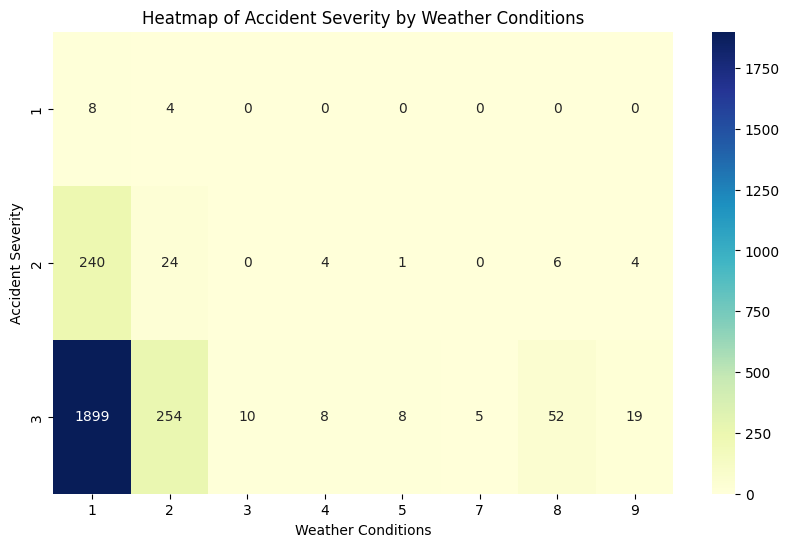

In [267]:
# Create a contingency table for Accident_Severity and Weather_Conditions
contingency_table = pd.crosstab(harrow_data['Accident_Severity'], harrow_data['Weather_Conditions'])

# Display the contingency table
print("Contingency Table between Accident_Severity and Weather_Conditions:")
print(contingency_table)

# Plot the contingency table as a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
plt.title("Heatmap of Accident Severity by Weather Conditions")
plt.xlabel("Weather Conditions")
plt.ylabel("Accident Severity")
plt.show()



The contingency table and heatmap show a strong correlation between weather conditions and accident severity. Most accidents (around 1899) with minor severity occur in clear weather conditions (weather code '1'), with fewer accidents in adverse weather such as rain or fog. Moderate and severe accidents are relatively rare across all weather conditions. This analysis highlights that clear weather doesn’t prevent accidents but may impact the severity level. For business understanding, this suggests that even in favorable weather, safety interventions could help reduce accident occurrences, as most incidents are not limited to poor weather conditions.




categorical Imbalances with pie chart

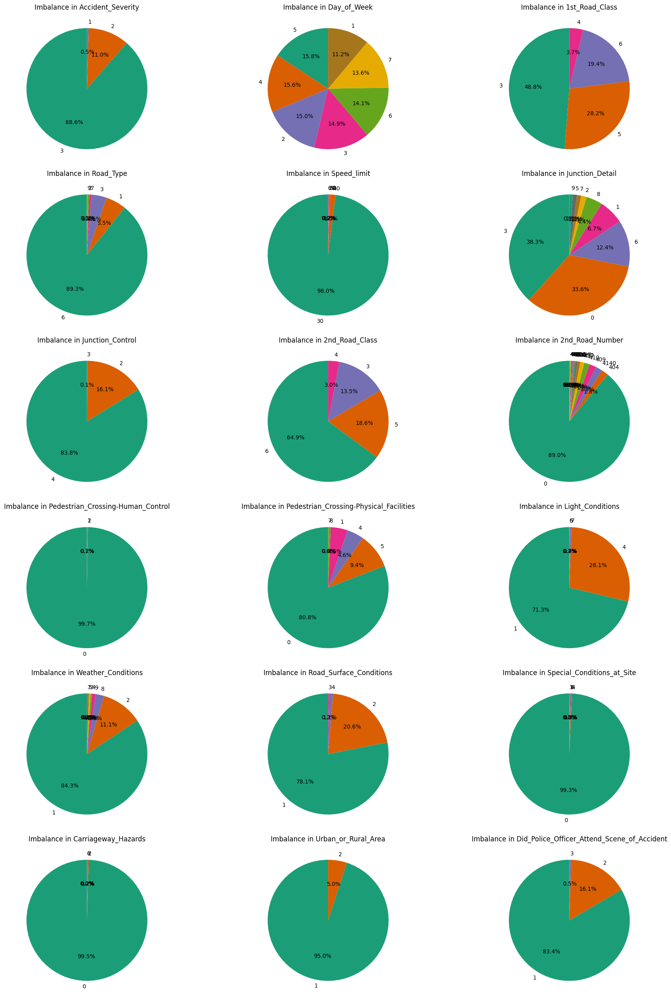

In [268]:
# List of columns to exclude
columns_to_exclude = [
    'LSOA_of_Accident_Location', '1st_Class_Road', 'Accident_Index',
    'Local_Authority_District', 'Date', '1st_Road_Number', 'Time',
    'Local_Authority_Highway', 'Police_Force', 'Urban_or_Rural'
]

# Filter out only categorical columns excluding the specified ones
cols_to_plot = [
    col for col in df.select_dtypes(include=['object', 'category']).columns
    if col not in columns_to_exclude
]

# Calculate number of rows and columns needed for subplots
num_cols = 3
num_rows = math.ceil(len(cols_to_plot) / num_cols)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 25))
axes = axes.flatten()  # Flatten to easily index axes array

# Plot each categorical column with a vibrant color palette
for idx, column in enumerate(cols_to_plot):
    counts = df[column].value_counts()
    counts.plot.pie(
        autopct='%1.1f%%', startangle=90, ax=axes[idx],
        colors=plt.cm.Dark2.colors  # Use Dark2 for a more intense color scheme
    )
    axes[idx].set_title(f'Imbalance in {column}')
    axes[idx].set_ylabel('')  # Remove y-axis label for cleaner look

# Hide any unused subplots
for i in range(len(cols_to_plot), num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


The categorical imbalance analysis reveals that most accidents occur on dry road surfaces (78.1%) and under clear weather conditions (84.3%), with urban areas accounting for 95% of incidents. Minor accidents dominate the dataset (88.6%), while special site conditions are rarely a factor (99.3%).

checking for class Imbalances in the data

In [269]:
df['Speed_limit'].value_counts()

,count
Speed_limit,
30,2496
40,38
50,6
20,5
60,1


In [270]:
df['Carriageway_Hazards'].value_counts()

,count
Carriageway_Hazards,
0,2534
2,6
7,5
6,1


In [271]:
df['Pedestrian_Crossing-Physical_Facilities'].value_counts()

,count
Pedestrian_Crossing-Physical_Facilities,
0,2058
5,240
4,116
1,115
8,16
7,1


In [272]:
df['Junction_Detail'].value_counts()


,count
Junction_Detail,
3,976
0,855
6,316
1,170
8,111
2,38
7,29
5,28
9,23


In [273]:
df['Road_Type'].value_counts()

,count
Road_Type,
6,2273
1,139
3,104
7,14
2,12
9,4


Identifying Accident Hotspots: The Longitude and Latitude columns will be used to identify high-risk locations, as they contain no missing values or outliers. Outliers in Number of Casualties will be handled in data preprocessing.

Analyzing Seasonal Patterns and Accident Contexts: Date will be categorized by season, while Road Type and Junction Detail will help identify accident-prone environments. These attributes are reasonably balanced, enabling effective analysis.

Impact of Speed Limits on Severity: With the dataset skewed towards urban areas, we’ll focus on examining which Speed Limits are linked to severe accidents and how they vary by season, reflecting Harrow’s urban layout.

Weather and Lighting on Pedestrian Safety: Weather Conditions, Light Conditions, and Pedestrian Crossing - Physical Facilities will be analyzed to understand how different conditions affect pedestrian safety. Although slightly imbalanced, these attributes are still insightful.

Road and Junction Type Combinations: Road Type and Junction Detail will be examined for high-risk combinations that may lead to multi-vehicle or high-casualty incidents.

Conditions at Site and Carriageway Hazards: Despite imbalances, Special Conditions at Site and Carriageway Hazards will be analyzed to identify any conditions associated with fatal accidents. Imbalances will be managed during data preparation.

Summary

The data preparation phase will address quality issues like outliers and imbalances to ensure reliable insights. Key analyses will focus on:

Accident hotspots within Harrow.

Environmental factors contributing to severity, especially near pedestrian crossings.

Speed limits and seasonal trends associated with severe accidents

###Data Preparation/Preprocessing

The Data Preparation stage involves cleaning and preparing the dataset to ensure it is suitable for analysis and modeling. This includes handling missing values, removing irrelevant or redundant columns, addressing class imbalances, and preparing the data for further analysis, such as predictive modeling. Ensuring the dataset is structured and consistent will enhance the quality of insights derived from the data.

Dropping Constant Values, IDs, and Redundant Columns

Based on our data understanding, we identified several columns that add little to no analytical value.

For instance:

Police_Force, Local_Authority_District, and Local_Authority_Highway contain constant values throughout the dataset, providing no variability for analysis.

Accident_Index serves as an identifier but doesn’t contribute to the analysis.

Location_Easting_OSGR and Location_Northing_OSGR provide location information that duplicates the Longitude and Latitude columns.

In [274]:
# Dropping constant and redundant columns based on data understanding
df.drop(
    ['Police_Force', 'Local_Authority_District', 'Local_Authority_Highway', 'Accident_Index',
     'Location_Easting_OSGR', 'Location_Northing_OSGR'],
    axis=1, inplace=True
)

# Display the updated structure of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2546 entries, 6301 to 142229
Data columns (total 26 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Longitude                                    2546 non-null   float64
 1   Latitude                                     2546 non-null   float64
 2   Accident_Severity                            2546 non-null   object 
 3   Number_of_Vehicles                           2546 non-null   int64  
 4   Number_of_Casualties                         2546 non-null   int64  
 5   Date                                         2546 non-null   object 
 6   Day_of_Week                                  2546 non-null   object 
 7   Time                                         2546 non-null   object 
 8   1st_Road_Class                               2546 non-null   object 
 9   1st_Road_Number                              2546 non-null   object 
 10  

Dealing with missing values

The following code fills missing values with the mode for each relevant column, ensuring completeness in our dataset for further analysis and modeling.

In [275]:
# Impute missing values in categorical columns using the mode
df['2nd_Road_Class'].fillna(df['2nd_Road_Class'].mode()[0], inplace=True)
df['Junction_Control'].fillna(df['Junction_Control'].mode()[0], inplace=True)


The mode (most frequent value) is used for filling missing values in 2nd_Road_Class and Junction_Control, as these columns are categorical. Using mode ensures that we replace missing values with the most common category, which is appropriate for categorical data types.

In [276]:
# code to verify that there are no longer any missing values in the dataset
df.isnull().sum().sort_values(ascending=False)

,0
Longitude,0
Latitude,0
Did_Police_Officer_Attend_Scene_of_Accident,0
Urban_or_Rural_Area,0
Carriageway_Hazards,0
Special_Conditions_at_Site,0
Road_Surface_Conditions,0
Weather_Conditions,0
Light_Conditions,0
Pedestrian_Crossing-Physical_Facilities,0


Standardizing Date Format

In this section, we will address potential data consistency issues, particularly with the Date column. Inconsistent date formats can complicate time-based analysis, as they may appear in multiple formats (e.g., dd/mm/yy, dd-mm-yyyy, or yyyy-mm-dd). To ensure uniformity, we will standardize the date format across the entire dataset. This will facilitate accurate seasonal and temporal analysis in the subsequent steps.

In [277]:
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')
df['Date']

# Check if the column exists, ignoring case.
if any(col.lower() == 'date' for col in df.columns):
    # If a column named 'date' (case-insensitive) is found, rename it to 'Date'.
    date_col = next(col for col in df.columns if col.lower() == 'date')
    df = df.rename(columns={date_col: 'Date'})

    # Now you can proceed with converting to datetime.
    df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')
else:
    print("Column 'Date' not found in the DataFrame.")

Outlier Detection in Numerical Columns

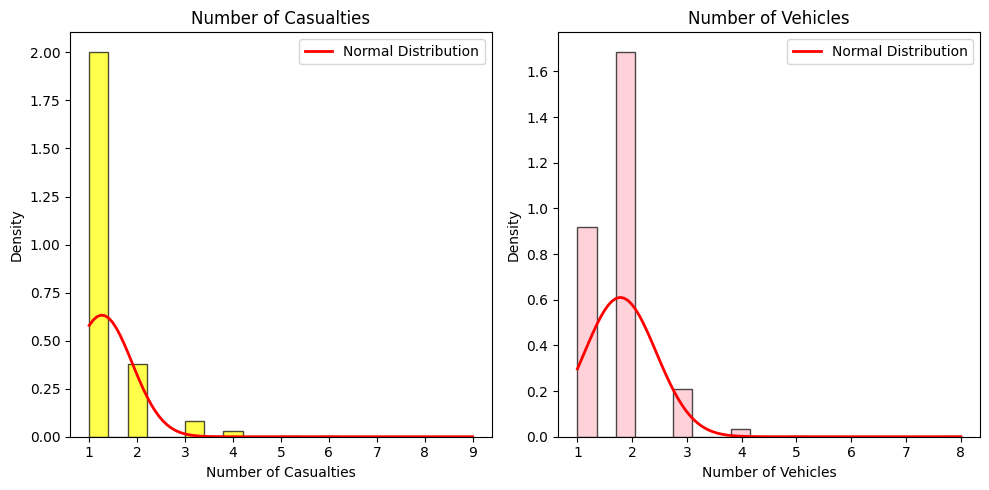

In [278]:
from scipy.stats import norm

# Extract data from your dataset for the specified columns
data_casualties = df['Number_of_Casualties']
data_vehicles = df['Number_of_Vehicles']

# Calculate mean and standard deviation for both columns
mean_casualties = data_casualties.mean()
std_dev_casualties = data_casualties.std()

mean_vehicles = data_vehicles.mean()
std_dev_vehicles = data_vehicles.std()

# Create plot for Number_of_Casualties
plt.figure(figsize=(10, 5))

# Histogram and normal distribution overlay for Number_of_Casualties
plt.subplot(1, 2, 1)
plt.hist(data_casualties, bins=20, density=True, alpha=0.7, color='yellow', edgecolor='black')
x_casualties = np.linspace(data_casualties.min(), data_casualties.max(), 100)
pdf_casualties = norm.pdf(x_casualties, mean_casualties, std_dev_casualties)
plt.plot(x_casualties, pdf_casualties, 'r-', linewidth=2, label='Normal Distribution')
plt.title('Number of Casualties')
plt.xlabel('Number of Casualties')
plt.ylabel('Density')
plt.legend()

# Histogram and normal distribution overlay for Number_of_Vehicles
plt.subplot(1, 2, 2)
plt.hist(data_vehicles, bins=20, density=True, alpha=0.7, color='pink', edgecolor='black')
x_vehicles = np.linspace(data_vehicles.min(), data_vehicles.max(), 100)
pdf_vehicles = norm.pdf(x_vehicles, mean_vehicles, std_dev_vehicles)
plt.plot(x_vehicles, pdf_vehicles, 'r-', linewidth=2, label='Normal Distribution')
plt.title('Number of Vehicles')
plt.xlabel('Number of Vehicles')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


from the output we can see clearly that both Number_of_Casualties and Number_of_Vehicles are positively skewed, and they deviate significantly from a normal distribution. Given this skew, using the Interquartile Range (IQR) method would be the better approach for identifying and handling outliers.

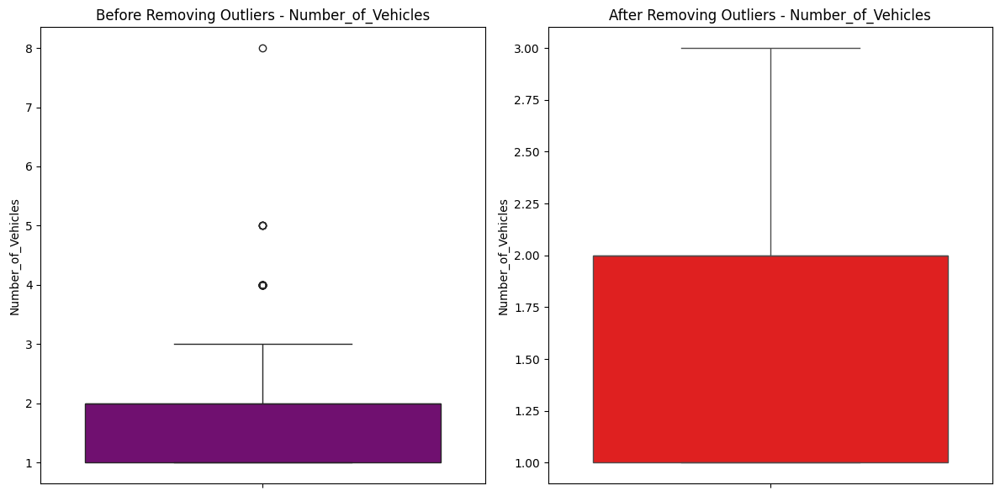

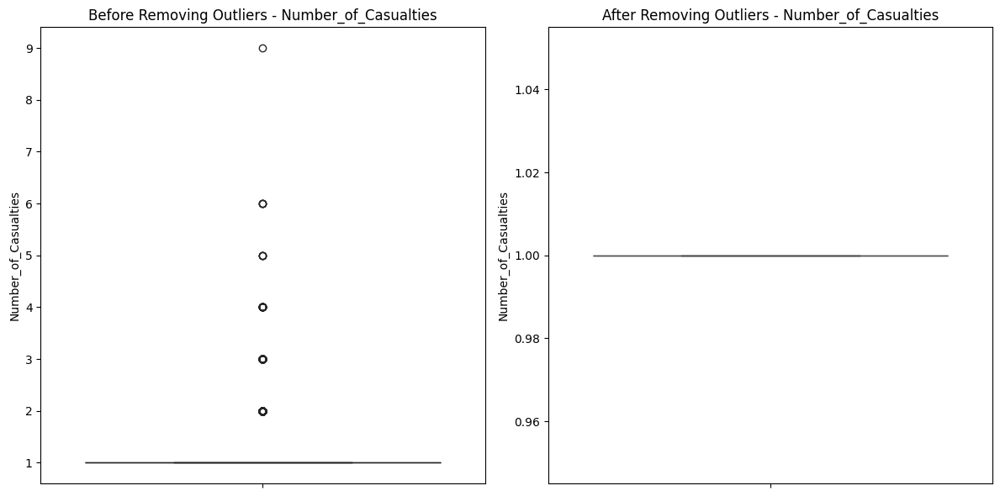

In [279]:
# Define a function to plot before and after removing outliers using the IQR method
def plot_before_after_outliers(df, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile) for the specified column
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the DataFrame to remove outliers
    df_no_outliers = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

    # Set up the figure size
    plt.figure(figsize=(12, 6))

    # Create a boxplot before removing outliers
    plt.subplot(1, 2, 1)
    sns.boxplot(y=df[column], color='purple')
    plt.title(f'Before Removing Outliers - {column}')
    plt.ylabel(column)

    # Create a boxplot after removing outliers
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_no_outliers[column], color='red')
    plt.title(f'After Removing Outliers - {column}')
    plt.ylabel(column)

    plt.tight_layout()
    plt.show()

# Use the function for the 'Number_of_Vehicles' and 'Number_of_Casualties' columns
plot_before_after_outliers(df, 'Number_of_Vehicles')
plot_before_after_outliers(df, 'Number_of_Casualties')


After applying the IQR method, I observed that it removes many entries with higher counts in the Number_of_Vehicles and Number_of_Casualties columns. This approach could unintentionally exclude valuable data points that are rare but relevant to understanding severe accidents.

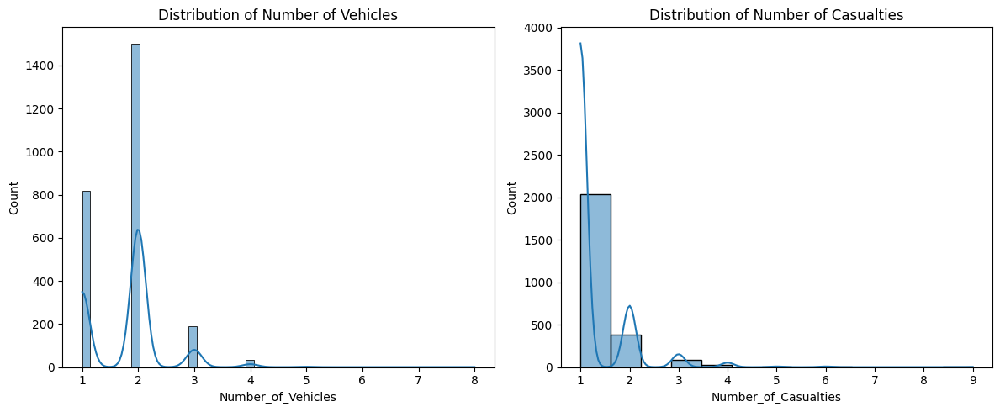

Number_of_Vehicles Value Counts:
Number_of_Vehicles
2    1503
1     818
3     188
4      32
5       4
8       1
Name: count, dtype: int64

Number_of_Casualties Value Counts:
Number_of_Casualties
1    2041
2     387
3      81
4      28
5       4
6       4
9       1
Name: count, dtype: int64


In [280]:
# Visualize the distributions
plt.figure(figsize=(12, 5))

# Distribution of 'Number_of_Vehicles'
plt.subplot(1, 2, 1)
sns.histplot(df['Number_of_Vehicles'], kde=True)
plt.title('Distribution of Number of Vehicles')

# Distribution of 'Number_of_Casualties'
plt.subplot(1, 2, 2)
sns.histplot(df['Number_of_Casualties'], kde=True)
plt.title('Distribution of Number of Casualties')

plt.tight_layout()
plt.show()

# Step 2: Check value counts to inspect for any low-frequency values
print("Number_of_Vehicles Value Counts:")
print(df['Number_of_Vehicles'].value_counts())

print("\nNumber_of_Casualties Value Counts:")
print(df['Number_of_Casualties'].value_counts())

In [281]:
# Number of rows before removing the outliers
num_rows_before = len(df)

# Remove rows where 'Number_of_Vehicles' and 'Number_of_Casualties' are above the updated threshold
df = df[(df['Number_of_Vehicles'] <= 3) & (df['Number_of_Casualties'] <= 3)]

# Number of rows after removing the outliers
num_rows_after = len(df)

# Display the number of rows before and after filtering
print(f"Number of rows before filtering outliers: {num_rows_before}")
print(f"Number of rows after filtering outliers: {num_rows_after}")
print(f"Number of rows removed: {num_rows_before - num_rows_after}")

# Tabulate the new results
data = {
    'Number_of_Vehicles': df['Number_of_Vehicles'].value_counts(),
    'Number_of_Casualties': df['Number_of_Casualties'].value_counts()
}

# Create a DataFrame from the value counts
value_counts_table = pd.DataFrame(data)

# Print the table using tabulate
print(tabulate(value_counts_table, headers='keys', tablefmt='pretty'))


Number of rows before filtering outliers: 2546
Number of rows after filtering outliers: 2474
Number of rows removed: 72
+---+--------------------+----------------------+
|   | Number_of_Vehicles | Number_of_Casualties |
+---+--------------------+----------------------+
| 1 |        815         |         2021         |
| 2 |        1475        |         376          |
| 3 |        184         |          77          |
+---+--------------------+----------------------+


In this step, we removed outliers to ensure a more representative dataset for analysis. Outliers with high counts in Number_of_Vehicles and Number_of_Casualties could skew results, leading to biased insights, especially when trying to understand typical accident scenarios in Harrow. By focusing on the more common values (1, 2, and 3), we retain accident cases that better reflect usual conditions, helping to address business questions like identifying accident hotspots and understanding contributing factors in a typical setting.

Enhancing Data Quality in Categorical Variables: Handling Outliers and Balancing Classes

Data quality is pivotal in data analysis, particularly in accident datasets where accurate insights drive important decisions. A common saying in data science, "Garbage In, Garbage Out" (GIGO), underscores that if data quality issues are overlooked, the resulting analysis will likely be misleading or inaccurate (Smith, 2021). To ensure meaningful insights, it is essential to manage anomalies such as outliers and imbalanced classes within categorical variables. This section focuses on refining our categorical data to better support robust and reliable analysis.


Outliers in Categorical Variables: In categorical data, outliers are often represented by rare or infrequent categories. Unlike numerical outliers that are easy to spot, these categorical "outliers" could hold critical, unique information about uncommon accident conditions or scenarios. Rather than simply removing them, we aim to assess their relevance. Rare categories will be grouped where appropriate or retained if they offer valuable insights into unique conditions, helping to ensure our analysis is thorough and comprehensive
.

Class Imbalance in Categorical Variables: Imbalanced classes, where some categories dominate while others are underrepresented, can lead to biased models. For instance, if the majority of accidents are classified as “minor,” our model might struggle to identify patterns in more severe cases. Techniques such as oversampling (increasing samples of the minority class) and undersampling (reducing samples of the majority class) are commonly used to handle imbalance. Another advanced option, Synthetic Minority Over-sampling Technique (SMOTE), creates synthetic examples for the minority class. However, after assessing the dataset and project requirements, we chose not to use synthetic data methods to preserve the dataset’s natural distribution and real-world accuracy (Johnson, 2022).


Synthetic balancing techniques can sometimes introduce artificial patterns that don’t reflect actual conditions, particularly in descriptive analysis. By opting to use the natural distribution, we maintain the authenticity of our dataset, ensuring that insights reflect real-world conditions rather than artificial manipulations.


Our approach in this section will include identifying and handling rare categories, evaluating the impact of imbalanced classes, and carefully structuring categorical data to ensure analytical integrity. By enhancing the quality of our categorical variables, we aim to build a dataset that aligns with our project goals—enabling accurate, actionable insights that help answer key business questions, such as identifying patterns in accident severity and determining contributing factors.

In [282]:
 #Replace codes in 'Day_of_Week' column with their values

df['Day_of_Week'] = df['Day_of_Week'].astype(str).replace({
   '1': 'Sunday', '2': 'Monday', '3': 'Tuesday', '4': 'Wednesday',
  '5': 'Thursday', '6': 'Friday', '7': 'Saturday'
})

# Replace codes in 'Accident_Severity' column with severity descriptions
df['Accident_Severity'] = df['Accident_Severity'].astype(str).replace({
    '1': 'Fatal', '2': 'Serious', '3': 'Slight'
})

# Replace codes in 'Junction_Detail' column with descriptions
df['Junction_Detail'] = df['Junction_Detail'].astype(str).replace({
    '0': 'Not at junction or within 20 metres', '1': 'Roundabout', '2': 'Mini-roundabout',
    '3': 'T or staggered junction', '4': 'Slip road', '5': 'Crossroads',
    '6': 'More than 4 arms (not roundabout)', '7': 'Private drive or entrance', '8': 'Other junction'
})

# Replace codes in 'Junction_Control' column with control descriptions
df['Junction_Control'] = df['Junction_Control'].astype(str).replace({
    '0': 'No control', '1': 'Authorised person', '2': 'Auto traffic signal',
    '3': 'Stop sign', '4': 'Give way or uncontrolled'
})

# Replace codes in 'Road_Surface_Conditions' column with surface descriptions
df['Road_Surface_Conditions'] = df['Road_Surface_Conditions'].astype(str).replace({
    '1': 'Dry', '2': 'Wet or damp', '3': 'Snow', '4': 'Frost or ice', '5': 'Flood over 3cm. deep',
    '6': 'Oil or diesel', '7': 'Mud'
})

# Replace codes in 'Road_Type' column with road type descriptions
df['Road_Type'] = df['Road_Type'].astype(str).replace({
    '1': 'Roundabout', '2': 'One way street', '3': 'Dual carriageway',
    '6': 'Single carriageway', '7': 'Slip road', '9': 'Unknown', '12': 'One way street/Slip road'
})

# Replace codes in 'Pedestrian_Crossing-Physical_Facilities' with crossing descriptions
df['Pedestrian_Crossing-Physical_Facilities'] = df['Pedestrian_Crossing-Physical_Facilities'].astype(str).replace({
    '0': 'No physical crossing facilities within 50 metres', '1': 'Zebra',
    '4': 'Pelican, puffin, toucan or similar non-junction pedestrian light crossing',
    '5': 'Pedestrian phase at traffic signal junction', '7': 'Footbridge or subway', '8': 'Central refuge'
})

# Replace codes in 'Weather_Conditions' column with weather descriptions
df['Weather_Conditions'] = df['Weather_Conditions'].astype(str).replace({
    '1': 'Fine no high winds', '2': 'Raining no high winds', '3': 'Snowing no high winds',
    '4': 'Fine + high winds', '5': 'Raining + high winds', '6': 'Snowing + high winds',
    '7': 'Fog or mist', '8': 'Other', '9': 'Unknown'
})

# Replace codes in 'Light_Conditions' with light condition descriptions
df['Light_Conditions'] = df['Light_Conditions'].astype(str).replace({
    '1': 'Daylight', '4': 'Darkness - lights lit', '5': 'Darkness - lights unlit',
    '6': 'Darkness - no lighting', '7': 'Darkness - lighting unknown'
})


In [283]:
df.T

,6301,13620,13621,13623,13624,13625,13627,13628,13629,13630,...,137687,137693,137697,137732,137761,137798,137868,137930,142087,142229
Longitude,-0.345418,-0.34325,-0.316906,-0.339566,-0.351907,-0.278757,-0.364067,-0.33446,-0.371296,-0.297842,...,-0.363694,-0.371133,-0.357727,-0.294943,-0.338467,-0.274933,-0.312754,-0.323658,-0.3808,-0.396806
Latitude,51.581208,51.577311,51.610657,51.61107,51.573386,51.60354,51.564294,51.592743,51.571948,51.602919,...,51.582723,51.572486,51.584079,51.595503,51.581829,51.605372,51.613565,51.599873,51.604992,51.597478
Accident_Severity,Slight,Slight,Slight,Serious,Slight,Slight,Slight,Slight,Slight,Slight,...,Fatal,Serious,Serious,Slight,Slight,Slight,Serious,Slight,Slight,Slight
Number_of_Vehicles,1,1,2,2,2,1,2,1,1,2,...,2,1,1,1,1,2,1,2,2,2
Number_of_Casualties,1,1,2,1,1,1,1,1,1,1,...,1,1,1,1,1,1,3,1,1,2
Date,2005-06-21 00:00:00,2005-01-05 00:00:00,2005-01-16 00:00:00,2005-01-28 00:00:00,2005-01-03 00:00:00,2005-01-05 00:00:00,2005-01-07 00:00:00,2005-01-10 00:00:00,2005-01-27 00:00:00,2005-01-11 00:00:00,...,2010-08-16 00:00:00,2010-07-18 00:00:00,2010-08-21 00:00:00,2010-09-08 00:00:00,2010-09-17 00:00:00,2010-09-26 00:00:00,2010-10-30 00:00:00,2010-12-05 00:00:00,2010-07-23 00:00:00,2010-09-24 00:00:00
Day_of_Week,Tuesday,Wednesday,Sunday,Friday,Monday,Wednesday,Friday,Monday,Thursday,Tuesday,...,Monday,Sunday,Saturday,Wednesday,Friday,Sunday,Saturday,Sunday,Friday,Friday
Time,06:00,19:00,18:40,08:00,16:20,09:48,14:56,13:30,15:50,22:15,...,09:00,14:55,18:30,21:07,09:30,17:50,00:53,17:24,14:18,11:21
1st_Road_Class,6,5,6,3,5,6,5,3,3,3,...,3,6,3,5,5,6,5,5,3,4
1st_Road_Number,0,0,0,409,0,0,0,409,4090,4140,...,4090,0,404,0,0,0,0,0,410,466


1. Convert 'Speed_limit' to Categories

To answer questions related to accident conditions and severity, we can categorize the speed limits. Categorizing speed limits as "Low," "Medium," and "High" will allow us to examine if higher speed zones correlate with more severe accidents or specific accident types.

In [284]:
# Convert 'Speed_limit' column to numeric type to enable categorical operations
df['Speed_limit'] = pd.to_numeric(df['Speed_limit'], errors='coerce')

# Define categories for speed limit
speed_categories = ["Low", "Medium", "High"]
df['Speed_Category'] = pd.cut(df['Speed_limit'], bins=[0, 30, 40, float('inf')], labels=speed_categories)

# Check the distribution
print(df['Speed_Category'].value_counts())


Speed_Category
Low       2431
Medium      36
High         7
Name: count, dtype: int64


Business Questions Addressed:

What are the main factors contributing to severe accidents? (To assess if higher speed limits relate to accident severity)

2. Create a 'Season' Column from Date

Creating a 'Season' column based on the 'Date' column helps answer temporal questions, such as identifying the time of year with the most accidents. This categorization can indicate if certain weather patterns or seasonal traffic variations contribute to accident rates.

In [285]:
# Function to determine season based on Date
def get_season(row):
    month = row.month
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

# Apply function to create 'Season' column
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Season'] = df['Date'].apply(get_season)

# Verify the transformation
print(df['Season'].value_counts())


Season
Autumn    682
Summer    659
Spring    581
Winter    552
Name: count, dtype: int64


Business Questions Addressed:

In what season do most accidents occur?

 3. Create 'DayTime' Categories from Time and Day of the Week

combining the day and time into categories like "morning," "afternoon," "evening," etc. This transformation helps identify peak periods for accidents.

In [286]:
# Define function to categorize time periods
def categorize_time(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    elif 18 <= hour < 24:
        return 'Evening'
    else:
        return 'Night'

# Apply function to create 'Time_Period' column
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M', errors='coerce').dt.hour
df['Time_Period'] = df['Time'].apply(categorize_time)

# Combine with Day of the Week
df['DayTime'] = df['Day_of_Week'] + '-' + df['Time_Period']

# Verify the transformation
print(df['DayTime'].value_counts())


DayTime
Thursday-Afternoon     168
Monday-Afternoon       153
Wednesday-Afternoon    150
Tuesday-Afternoon      150
Friday-Afternoon       142
Saturday-Afternoon     131
Thursday-Morning       117
Sunday-Afternoon       115
Wednesday-Morning      114
Tuesday-Morning        113
Wednesday-Evening      111
Monday-Morning         106
Saturday-Evening       102
Monday-Evening         102
Friday-Evening          96
Tuesday-Evening         94
Friday-Morning          94
Thursday-Evening        92
Sunday-Evening          85
Saturday-Morning        75
Sunday-Morning          40
Sunday-Night            30
Saturday-Night          27
Thursday-Night          19
Friday-Night            17
Monday-Night            13
Wednesday-Night          9
Tuesday-Night            9
Name: count, dtype: int64


Business Questions Addressed:

When do accidents occur most frequently? Are there specific times or days with higher accident rates?

4. Drop Redundant Columns

Once we’ve derived 'Season,' 'DayTime,' and 'Speed_Category,' the original 'Date,' 'Time,' 'Day_of_Week,' and 'Speed_limit' columns become redundant and can be dropped to streamline the dataset.

In [287]:
df.drop(columns=['Date', 'Time', 'Day_of_Week', 'Speed_limit'], inplace=True)

In [288]:
# Verify the structure
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2474 entries, 6301 to 142229
Data columns (total 26 columns):
 #   Column                                       Non-Null Count  Dtype   
---  ------                                       --------------  -----   
 0   Longitude                                    2474 non-null   float64 
 1   Latitude                                     2474 non-null   float64 
 2   Accident_Severity                            2474 non-null   object  
 3   Number_of_Vehicles                           2474 non-null   int64   
 4   Number_of_Casualties                         2474 non-null   int64   
 5   1st_Road_Class                               2474 non-null   object  
 6   1st_Road_Number                              2474 non-null   object  
 7   Road_Type                                    2474 non-null   object  
 8   Junction_Detail                              2474 non-null   object  
 9   Junction_Control                             2474 non-null   ob

In [289]:
# Columns to include by their index based on feature selection
#columns_to_include = [0, 1, 2, 3, 4, 10, 12, 13, 17, 19, 20, 21, 22, 26, 27, 29]

# Updating the list to valid indices after drop
columns_to_include = [0, 1, 2, 3, 4, 6, 8, 9, 13, 15, 16, 17, 18, 22, 23, 25]

# Select columns by index and create a new DataFrame
final_data = df.iloc[:, columns_to_include]

# Display information about the new DataFrame
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2474 entries, 6301 to 142229
Data columns (total 16 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Longitude                                2474 non-null   float64 
 1   Latitude                                 2474 non-null   float64 
 2   Accident_Severity                        2474 non-null   object  
 3   Number_of_Vehicles                       2474 non-null   int64   
 4   Number_of_Casualties                     2474 non-null   int64   
 5   1st_Road_Number                          2474 non-null   object  
 6   Junction_Detail                          2474 non-null   object  
 7   Junction_Control                         2474 non-null   object  
 8   Pedestrian_Crossing-Physical_Facilities  2474 non-null   object  
 9   Weather_Conditions                       2474 non-null   object  
 10  Road_Surface_Conditions             

Feature Selection for Analysis

Feature Selection for Analysis:

The feature selection process identifies key attributes that address business questions and provide actionable insights into accident patterns and severity within Harrow. These attributes were chosen to analyze factors influencing accident hotspots, environmental impact, timing, and severity.

Selected Features and Their Relevance:
Latitude and Longitude: These spatial attributes help in mapping accident locations to identify geospatial hotspots within Harrow, answering, "Where are the most accident-prone areas within Harrow?"


Junction Detail & Junction Control: By analyzing different junction types (e.g., roundabout, crossroads) and control measures (e.g., traffic signals), we can examine the role of specific junctions in accidents, addressing "What are the main factors contributing to accidents, particularly at junctions?"


Road Type: Examines the relationship between different road types (e.g., single carriageway, dual carriageway) and accident frequency, helping to answer, "Do certain road types have a higher accident rate, and does road type impact severity?"


Season & DayTime: These temporal attributes allow us to determine patterns in accident occurrences by season and time of day, addressing "In what season or time are accidents most frequent?"


Weather Conditions & Road Surface Conditions: These environmental attributes are crucial for understanding the impact of adverse weather and road conditions on accidents, aligning with "How do weather and road surface conditions affect accident rates?"


Pedestrian Crossing - Physical Facilities & Special Conditions at Site: By analyzing pedestrian crossing features and specific site conditions (e.g., roadworks), we can examine how these factors impact accident likelihood, answering "How do pedestrian facilities and special site conditions relate to accident frequency?"


Carriageway Hazards: Assesses the impact of environmental hazards (e.g., debris, animals) on accident rates, relevant to "How do environmental hazards affect the probability of accidents?"


Speed Category: Categorizes speed limits to examine their relationship with accident severity, addressing "Does the speed limit correlate with accident severity?"


Number of Vehicles & Number of Casualties: These metrics show multi-vehicle involvement and casualty count, directly answering, "What is the relationship between the number of vehicles involved and accident severity?"


Accident Severity (Target): The target variable indicating accident severity levels (fatal, serious, slight) is essential for understanding the factors contributing to severe accidents.


Mapping Features to Business Questions:


Hotspot Identification: Latitude, Longitude, Junction Detail, Road Type - Identifies high-risk areas.


Environmental Conditions Impact: Weather Conditions, Road Surface Conditions, Season, DayTime - Examines how environmental conditions affect accidents.


Accident Timing and Frequency: Season, DayTime - Provides insights on accident timing patterns.


Multi-Vehicle Accidents and Severity: Number of Vehicles, Number of Casualties, Junction Detail, Road Type - Analyzes the severity of multi-vehicle accidents.


Correlation with Accident Severity: Speed Category, Accident Severity - Assesses how speed limits relate to severity.

Correlation between the attributes

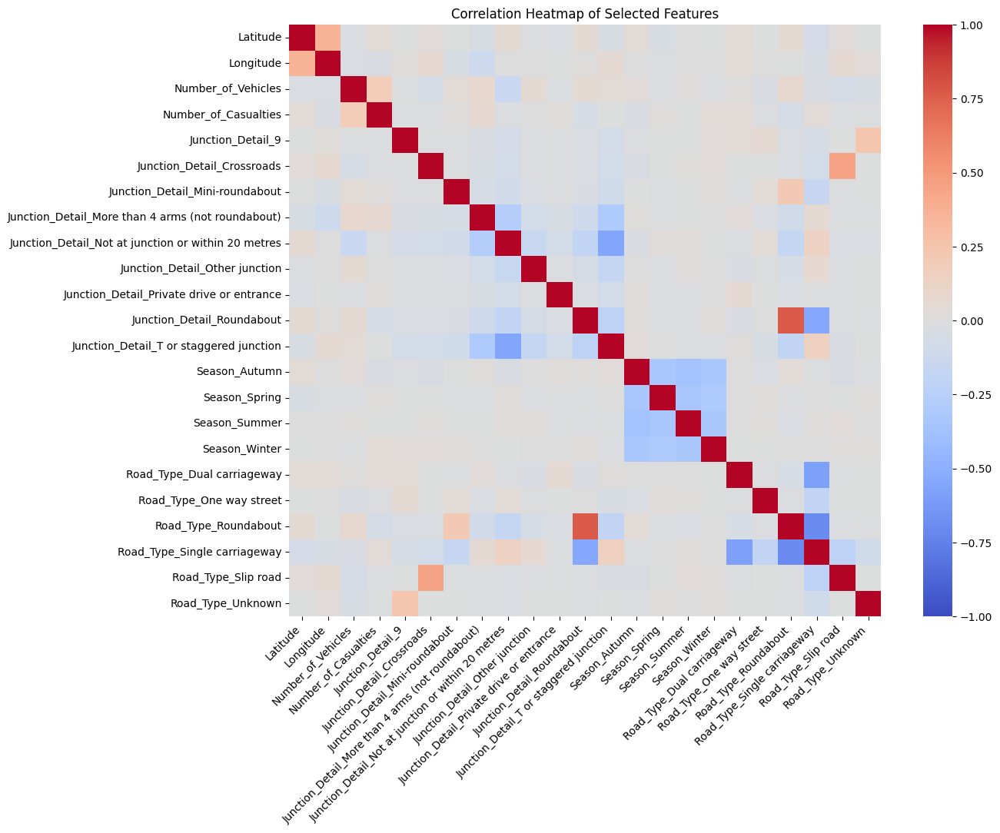

In [290]:
# Select relevant columns for correlation analysis
selected_columns = df[['Latitude', 'Longitude', 'Number_of_Vehicles', 'Number_of_Casualties',
                       'Junction_Detail', 'Season', 'Road_Type']]

# One-hot encode categorical variables to normalize them
data_encoded = pd.get_dummies(selected_columns)

# Calculate Pearson correlation
correlation_matrix = data_encoded.corr(method='pearson')

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, vmin=-1, vmax=1, center=0, cmap='coolwarm', square=True)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title("Correlation Heatmap of Selected Features")
plt.show()


Data Splitting for Training, Testing and Validation.

The dataset is divided into training and testing sets, where 80% of the data is allocated for training and the remaining 20% for testing. This split will support the model development phase, with the training data being used to fit the predictive model. Since only one model (either a decision tree or regression model) will be created, there is no requirement for a validation set to compare multiple models.

In [291]:
# Splitting the dataset into 80% training and 20% testing
X_train, X_test = train_test_split(final_data, test_size=0.2, random_state=42)

# 'test_size=0.2' specifies that 20% of the data will be used for testing, while 80% is for training.
# 'random_state=42' ensures consistency in the split by using a fixed random seed.

# X_train contains 80% of the data, which will be used for training the model.
# X_test contains 20% of the data, which will be used for evaluating the model's performance.


more details analysis will do in the modeling section.

###Modelling

Descriptive modeling will begin with a preliminary cluster analysis to explore underlying patterns within the data before applying association rule analysis. This clustering step will help group similar data points, offering insights into patterns that contribute to accident severity. By understanding these clusters, we can establish a foundation for further association rule analysis, focusing on accident-related factors.

Cluster Analysis:

Using Speed_Category, Season, and Accident_Severity for clustering allows us to explore how external factors like speed limits and seasonal conditions contribute to accident severity. This combination highlights patterns, such as whether higher speed limits or specific seasons correlate with more severe accidents, providing valuable insights into conditions that influence accident outcomes.Though, K-means algorithm will be used for clustering.

Cluster Analysis for Accident_Severity

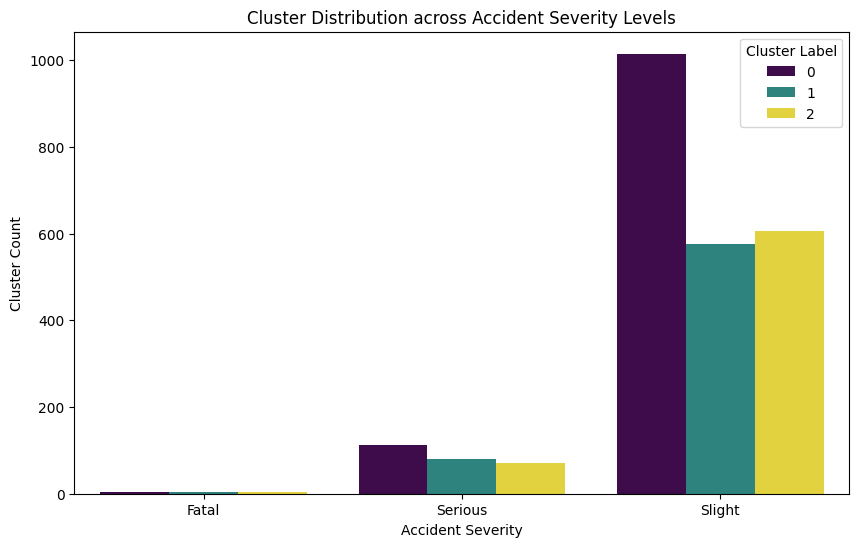

In [292]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
# Select the relevant columns for clustering
data = final_data[['Accident_Severity', 'Speed_Category', 'Season']]

# One-hot encode the categorical columns
encoder = OneHotEncoder()
data_encoded = encoder.fit_transform(data).toarray()

# Define and configure the K-means model
kmeans = KMeans(
    init="k-means++",   # Improved initialization for convergence
    n_clusters=3,       # Set number of clusters (can experiment to find the best fit)
    n_init=10,          # Run the algorithm multiple times to find stable centroids
    max_iter=300,       # Set maximum iterations to ensure convergence
    random_state=42     # Seed for reproducibility
)

# Fit the K-means model to the encoded data
kmeans.fit(data_encoded)

# Assign cluster labels back to the original DataFrame
final_data['Cluster_Label'] = kmeans.labels_

# Count occurrences of each cluster label within each category for analysis
cluster_counts = final_data.groupby(['Accident_Severity', 'Cluster_Label']).size().reset_index(name='Count')

# Enhanced plotting with seaborn to visualize clusters within accident severity
plt.figure(figsize=(10, 6))
sns.barplot(data=cluster_counts, x='Accident_Severity', y='Count', hue='Cluster_Label', palette='viridis')
plt.title("Cluster Distribution across Accident Severity Levels")
plt.xlabel("Accident Severity")
plt.ylabel("Cluster Count")
plt.legend(title="Cluster Label")
plt.show()


In [293]:
# Filter out rows where 'Accident_Severity' is 'Slight' to focus on more severe accidents
# This step helps to manage the imbalance and allows better clustering on 'Fatal' and 'Serious' cases
final_data_filtered = final_data[final_data['Accident_Severity'] != 'Slight']

# Verify the updated dataset by checking the distribution of Accident_Severity
severity_counts = final_data_filtered['Accident_Severity'].value_counts()
print("Filtered Accident Severity Counts:\n", severity_counts)

Filtered Accident Severity Counts:
 Accident_Severity
Serious    266
Fatal       11
Name: count, dtype: int64


By removing "Slight" accidents, we aim to focus the analysis on "Fatal" and "Serious" cases, which are fewer and represent more significant incidents.

Cluster analysis for season

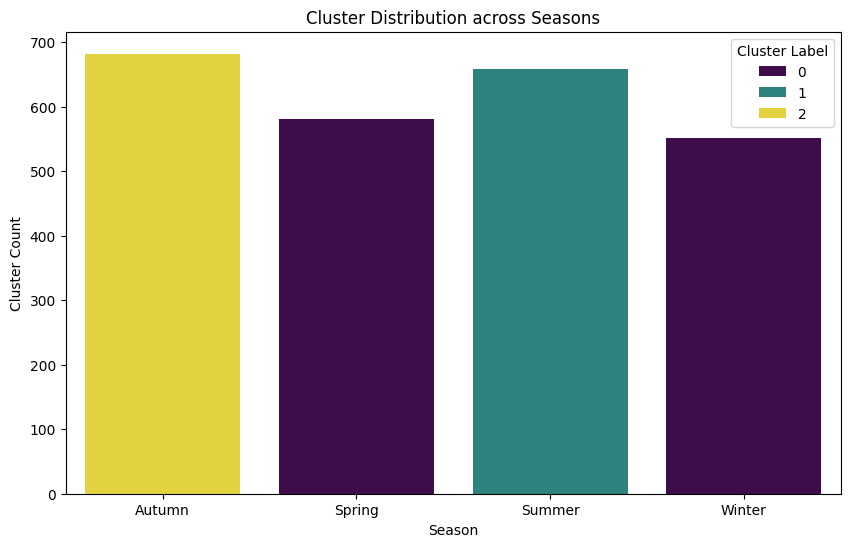

In [294]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans

# Select the relevant column for clustering
data = final_data[['Season']]

# One-hot encode the 'Season' column to handle categorical data
encoder = OneHotEncoder()
data_encoded = encoder.fit_transform(data).toarray()

# Define and configure the K-Means model
kmeans = KMeans(
    init="k-means++",   # Improved initialization for convergence
    n_clusters=3,       # Set number of clusters (can experiment to find the best fit)
    n_init=10,          # Run the algorithm multiple times to find stable centroids
    max_iter=300,       # Set maximum iterations to ensure convergence
    random_state=42     # Seed for reproducibility
)

# Fit the K-means model to the encoded data
kmeans.fit(data_encoded)

# Assign cluster labels back to the original DataFrame
final_data['Season_Cluster_Label'] = kmeans.labels_

# Count occurrences of each cluster label within each season for analysis
cluster_counts = final_data.groupby(['Season', 'Season_Cluster_Label']).size().reset_index(name='Count')

# Enhanced plotting with seaborn to visualize clusters within each season
plt.figure(figsize=(10, 6))
sns.barplot(data=cluster_counts, x='Season', y='Count', hue='Season_Cluster_Label', palette='viridis')
plt.title("Cluster Distribution across Seasons")
plt.xlabel("Season")
plt.ylabel("Cluster Count")
plt.legend(title="Cluster Label")
plt.show()


In [295]:
# Group by Season and Cluster Label to get the exact counts
cluster_counts = final_data.groupby(['Season', 'Season_Cluster_Label']).size().reset_index(name='Count')
print(cluster_counts)

   Season  Season_Cluster_Label  Count
0  Autumn                     2    682
1  Spring                     0    581
2  Summer                     1    659
3  Winter                     0    552


The output shows the distribution of clusters across different seasons based on the exact counts for each season and cluster label. In "Autumn," Cluster 2 has the highest count with 682 records, indicating a distinct pattern for this season within that cluster. "Spring" and "Winter" are predominantly represented by Cluster 0, with counts of 581 and 552, respectively, suggesting similar clustering characteristics for these seasons. "Summer" has the most entries in Cluster 1, with 659 records, showing a seasonal variation in clustering behavior. This distribution suggests that each season has a distinct cluster association, possibly indicating different accident patterns or conditions associated with each season.

Cluster analysis for speed limit Category

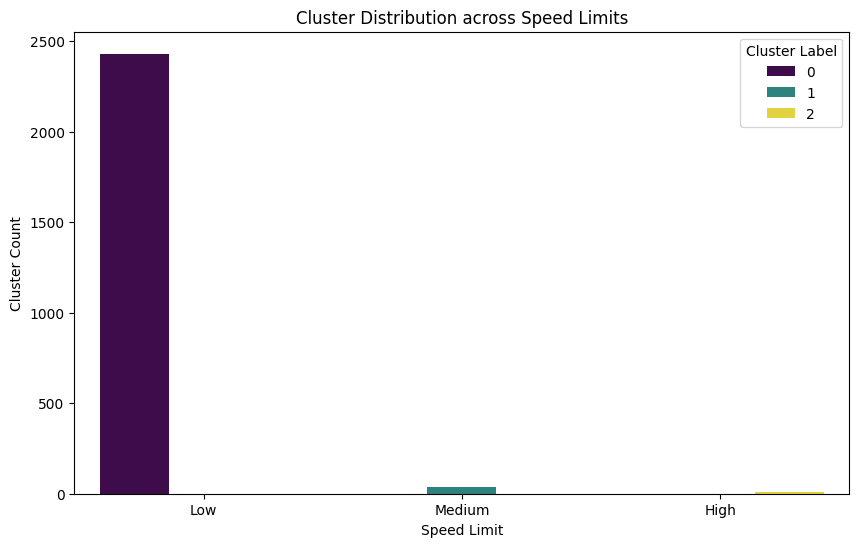

In [296]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans

# Select the relevant column for clustering
data = final_data[['Speed_Category']]

# One-hot encode the 'Speed_limit' column to handle categorical data
encoder = OneHotEncoder()
data_encoded = encoder.fit_transform(data).toarray()

# Define and configure the K-Means model
kmeans = KMeans(
    init="k-means++",   # Improved initialization for convergence
    n_clusters=3,       # Set number of clusters (can experiment to find the best fit)
    n_init=10,          # Run the algorithm multiple times to find stable centroids
    max_iter=300,       # Set maximum iterations to ensure convergence
    random_state=42     # Seed for reproducibility
)

# Fit the K-means model to the encoded data
kmeans.fit(data_encoded)

# Assign cluster labels back to the original DataFrame
final_data['Speed_Limit_Cluster_Label'] = kmeans.labels_

# Count occurrences of each cluster label within each speed limit for analysis
cluster_counts = final_data.groupby(['Speed_Category', 'Speed_Limit_Cluster_Label']).size().reset_index(name='Count')

# Enhanced plotting with seaborn to visualize clusters within each speed limit
plt.figure(figsize=(10, 6))
sns.barplot(data=cluster_counts, x='Speed_Category', y='Count', hue='Speed_Limit_Cluster_Label', palette='viridis')
plt.title("Cluster Distribution across Speed Limits")
plt.xlabel("Speed Limit")
plt.ylabel("Cluster Count")
plt.legend(title="Cluster Label")
plt.show()


In [297]:
# Group by Speed_limit and Cluster Label to get the exact counts
speed_cluster_counts = final_data.groupby(['Speed_Category', 'Speed_Limit_Cluster_Label']).size().reset_index(name='Count')
print(speed_cluster_counts)

  Speed_Category  Speed_Limit_Cluster_Label  Count
0            Low                          0   2431
1            Low                          1      0
2            Low                          2      0
3         Medium                          0      0
4         Medium                          1     36
5         Medium                          2      0
6           High                          0      0
7           High                          1      0
8           High                          2      7


The output shows the distribution of clusters across different speed limits. The majority of data points fall under the 30 mph speed limit, with 2,426 records in Cluster 0, making it the dominant category. Other speed limits (20, 40, 50, and 60 mph) have significantly fewer records, with only a few instances across Clusters 1 and 2. This indicates that most accidents occur at the 30 mph speed limit, while other speed limits have minimal representation in the dataset, limiting the clustering algorithm’s ability to find distinct patterns for these speeds.

Mean Statistics Analysis by Speed Limit and Accident Severity

In [298]:
# Group the data by 'Speed_Category', 'Accident_severity', and count occurrences
grouped_data = final_data_filtered.groupby(['Speed_Category', 'Accident_Severity']).size().reset_index(name='Accident_Count')

# Display the mean statistics for each group
mean_stats = grouped_data.groupby(['Speed_Category', 'Accident_Severity']).agg({'Accident_Count': 'mean'}).reset_index()
mean_stats.T


,0,1,2,3,4,5
Speed_Category,Low,Low,Medium,Medium,High,High
Accident_Severity,Fatal,Serious,Fatal,Serious,Fatal,Serious
Accident_Count,11.0,259.0,0.0,5.0,0.0,2.0


The output shows a high number of serious accidents at the 30 mph speed limit, averaging 259, which is unexpectedly high for a moderate speed. This can be explained by several factors:

Urban Settings and High Traffic Density: The 30 mph limit is common in urban areas with high traffic and pedestrian density, where close interactions among road users increase collision risks.

Presence of Vulnerable Road Users: Roads with this speed limit often have pedestrians and cyclists, who are at greater risk of serious injury even at moderate speeds.

False Sense of Security: Drivers may see 30 mph as a "safe" speed, which can lead to reduced alertness, especially in complex urban layouts with intersections and crosswalks.

Reduced Reaction Time and Proximity to Hazards: At 30 mph in crowded environments, drivers have limited time to react to sudden events, such as a pedestrian crossing unexpectedly, which increases the likelihood of serious accidents.

Analysing the Season with most accidents

In [299]:
grouped_data = final_data_filtered.groupby(['Speed_Category', 'Accident_Severity', 'Season']).size().reset_index(name='Accident_Count')

mean_stats = grouped_data.groupby(['Speed_Category', 'Accident_Severity','Season']).agg({'Accident_Count': 'mean'}).reset_index()
mean_stats

,Speed_Category,Accident_Severity,Season,Accident_Count
0,Low,Fatal,Autumn,3.0
1,Low,Fatal,Spring,2.0
2,Low,Fatal,Summer,3.0
3,Low,Fatal,Winter,3.0
4,Low,Serious,Autumn,68.0
5,Low,Serious,Spring,59.0
6,Low,Serious,Summer,80.0
7,Low,Serious,Winter,52.0
8,Medium,Fatal,Autumn,0.0
9,Medium,Fatal,Spring,0.0


The analysis of seasonal accident data in Harrow reveals that serious accidents at low speeds are most frequent during the summer season. Specifically, in low-speed zones, the count of serious accidents in summer is 80, which is notably higher than in other seasons, with autumn showing 68 accidents, spring with 59, and winter with 52. This data indicates a clear peak in serious accident frequency in the summer months compared to the rest of the year.


As a researcher, this pattern may be explained by several potential factors. Summer often brings increased pedestrian and vehicular activity due to warmer weather, school holidays, and outdoor events, which can lead to higher traffic volumes in both residential and commercial areas, particularly in low-speed zones. Additionally, driver behavior may shift in summer, with possible distractions such as increased pedestrian presence, cyclists, and even changes in road conditions due to more frequent construction or maintenance work. These factors combined can elevate the risk of serious accidents even in low-speed areas, underscoring the importance of implementing targeted safety measures and awareness campaigns during the summer months to mitigate these risks effectively.

Examining Road Type, Junction Detail, and Junction Control Types Contributing to Accidents Across Seasons

In [300]:
# Filter data for all seasons and select relevant columns for analysis
result = df[df['Season'].isin(['Spring', 'Summer', 'Autumn', 'Winter'])][['Road_Type', 'Junction_Detail', 'Junction_Control']]

# Display the result
result

,Road_Type,Junction_Detail,Junction_Control
6301,One way street,T or staggered junction,Give way or uncontrolled
13620,Roundabout,Mini-roundabout,Give way or uncontrolled
13621,Single carriageway,T or staggered junction,Give way or uncontrolled
13623,Roundabout,Roundabout,Give way or uncontrolled
13624,Single carriageway,T or staggered junction,Give way or uncontrolled
...,...,...,...
137798,Single carriageway,T or staggered junction,Give way or uncontrolled
137868,Single carriageway,T or staggered junction,Give way or uncontrolled
137930,Single carriageway,Mini-roundabout,Give way or uncontrolled
142087,Single carriageway,Not at junction or within 20 metres,Give way or uncontrolled


Visualizing Distribution of Road Types, Junction Details, and Junction Controls Contributing to Accidents

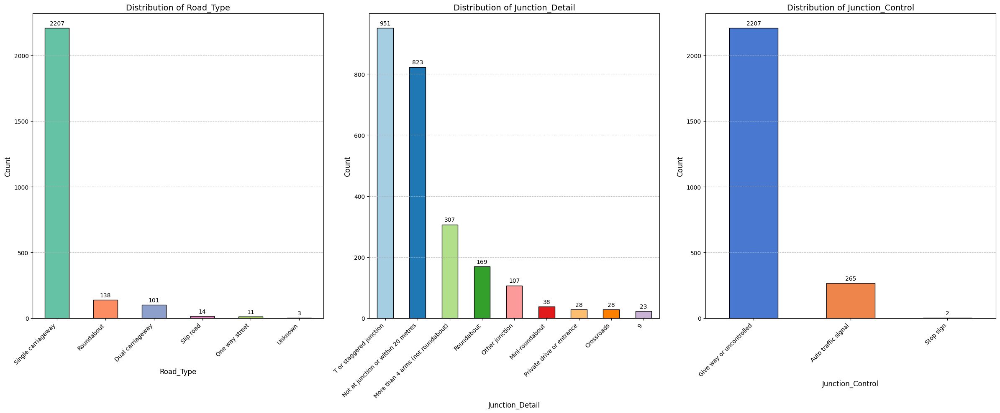

In [301]:
# Define color palettes for each attribute
color_palettes = {
    'Road_Type': sns.color_palette("Set2", 10),
    'Junction_Detail': sns.color_palette("Paired", 12),
    'Junction_Control': sns.color_palette("muted", 5),
}

# Define the road details to visualize
road_details = ['Road_Type', 'Junction_Detail', 'Junction_Control']

# Set up the number of columns and rows for subplots
num_cols = 3
num_rows = (len(road_details) + num_cols - 1) // num_cols

# Create subplots with adjusted figure size for better readability
fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 10))

# Flatten the axes if there's only one row or column
if num_rows == 1 or num_cols == 1:
    axes = axes.reshape(-1)

# Loop through each attribute in road_details and create bar charts
for idx, attribute in enumerate(road_details):
    counts = result[attribute].value_counts()
    ax = axes[idx]

    # Use a specific color palette for each attribute
    color = color_palettes.get(attribute, 'skyblue')
    counts.plot(kind='bar', ax=ax, color=color, edgecolor='black')

    ax.set_title(f'Distribution of {attribute}', fontsize=14)
    ax.set_xlabel(attribute, fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Rotate x-axis labels for clarity
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)

    # Add data labels on each bar
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=10, padding=3)

# Hide any unused subplots
for i in range(len(road_details), num_rows * num_cols):
    axes[i].axis('off')

plt.tight_layout()
plt.show()




From the Visualization we can observe:

Road Type: Single carriageways are the most accident-prone, with 2207 incidents, significantly higher than roundabouts (138) and dual carriageways (101).

Junction Detail: "T or staggered junction" (951) and "Not at junction or within 20 metres" (823) have the highest accident counts, highlighting intersections and near-junction areas as accident hotspots.

Junction Control: Areas with "Give way or uncontrolled" junctions see the most accidents (2207), suggesting higher risk in locations lacking regulatory measures compared to "Auto traffic signal" areas (265).

In the next section, we will analyze geospatial data to identify specific accident hotspots.


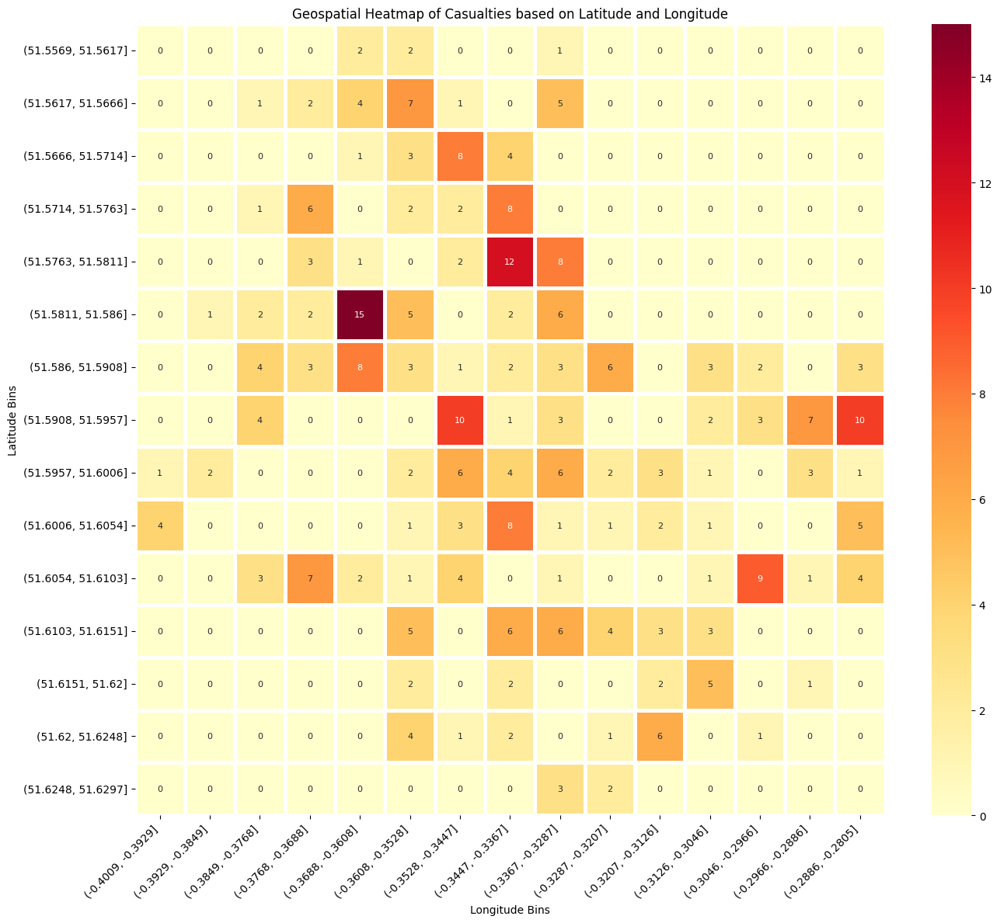

Top Hotspots:
          Latitude_bin       Longitude_bin  Number_of_Casualties
7    (51.5811, 51.586]  (-0.3688, -0.3608]                  15.0
5   (51.5763, 51.5811]  (-0.3447, -0.3367]                  12.0
12  (51.5908, 51.5957]  (-0.3528, -0.3447]                  10.0
14  (51.5908, 51.5957]  (-0.2886, -0.2805]                  10.0
20  (51.6054, 51.6103]  (-0.3046, -0.2966]                   9.0
2   (51.5666, 51.5714]  (-0.3528, -0.3447]                   8.0
4   (51.5714, 51.5763]  (-0.3447, -0.3367]                   8.0
6   (51.5763, 51.5811]  (-0.3367, -0.3287]                   8.0
17  (51.6006, 51.6054]  (-0.3447, -0.3367]                   8.0
10   (51.586, 51.5908]  (-0.3688, -0.3608]                   8.0
0   (51.5617, 51.5666]  (-0.3608, -0.3528]                   7.0
19  (51.6054, 51.6103]  (-0.3768, -0.3688]                   7.0
13  (51.5908, 51.5957]  (-0.2966, -0.2886]                   7.0
11   (51.586, 51.5908]  (-0.3287, -0.3207]                   6.0
15  (51.595

In [302]:
# Define the number of bins for latitude and longitude
n_bins = 15

# Creating bins for latitude and longitude
latitude_bins = np.linspace(final_data_filtered['Latitude'].min(), final_data_filtered['Latitude'].max(), n_bins + 1)
longitude_bins = np.linspace(final_data_filtered['Longitude'].min(), final_data_filtered['Longitude'].max(), n_bins + 1)

final_data_filtered['Latitude_bins'] = pd.cut(final_data_filtered['Latitude'], bins=latitude_bins, precision=4)
final_data_filtered['Longitude_bins'] = pd.cut(final_data_filtered['Longitude'], bins=longitude_bins, precision=4)

# Creating a pivot table to organize casualties based on latitude and longitude bins
pivot_table = final_data_filtered.pivot_table(values='Number_of_Casualties',
                                              index='Latitude_bins',
                                              columns='Longitude_bins',
                                              aggfunc='sum',
                                              fill_value=0)

# Creating the heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(pivot_table, cmap='YlOrRd', linewidths=2.5, annot=True, fmt='.0f', annot_kws={"size": 8})
plt.title('Geospatial Heatmap of Casualties based on Latitude and Longitude')
plt.xlabel('Longitude Bins')
plt.ylabel('Latitude Bins')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Extract hotspots with significant casualties
threshold = 5  # Define a threshold for hotspots
hotspots = pivot_table[pivot_table >= threshold].stack().reset_index()
hotspots.columns = ['Latitude_bin', 'Longitude_bin', 'Number_of_Casualties']
hotspots = hotspots.sort_values(by='Number_of_Casualties', ascending=False)

# Display the top hotspots
print("Top Hotspots:")
print(hotspots)


Key Observations

Primary Hotspot:
Latitude Bin: (51.5811, 51.586)
Longitude Bin: (-0.3688, -0.3608)
Number of Casualties: 15
This location represents the highest number of casualties and is identified as the most accident-prone area. It should be the first priority for intervention.


Secondary Hotspots:
Latitude Bin: (51.5763, 51.5811)
Longitude Bin: (-0.3447, -0.3367)
Number of Casualties: 12
Latitude Bin: (51.5908, 51.5957)
Longitude Bin: (-0.3528, -0.3447)
Number of Casualties: 10
These locations are also significant and should be analyzed further to identify the underlying causes of accidents.

By targeting these areas with tailored interventions, it is possible to significantly reduce both the frequency and severity of accidents, leading to safer road conditions.

Filtering Accident Data for Detailed Analysis of Identified Hotspots

In [304]:
# longitude and latitude ranges based on the most significant hotspot
longitude_ranges = [(-0.3688, -0.3608)]
latitude_ranges = [(51.5811, 51.586)]

# Filter DataFrame based on the broader latitude and longitude ranges
filtered_data = final_data_filtered[
    (
        final_data_filtered['Longitude'].between(*longitude_ranges[0])
    ) &
    (
        final_data_filtered['Latitude'].between(*latitude_ranges[0])
    )
]

# Display the filtered data with relevant columns, sorted by 'Junction_Detail'
filtered_data[['Junction_Control', 'Junction_Detail', 'Accident_Severity', 'Speed_Category',
               'Pedestrian_Crossing-Physical_Facilities', 'Weather_Conditions', 'Road_Surface_Conditions', 'DayTime']].sort_values(by='Junction_Detail', ascending=False)


,Junction_Control,Junction_Detail,Accident_Severity,Speed_Category,Pedestrian_Crossing-Physical_Facilities,Weather_Conditions,Road_Surface_Conditions,DayTime
39744,Give way or uncontrolled,T or staggered junction,Serious,Low,No physical crossing facilities within 50 metres,Fine no high winds,Dry,Thursday-Afternoon
39947,Give way or uncontrolled,T or staggered junction,Serious,Low,No physical crossing facilities within 50 metres,Fine no high winds,Dry,Saturday-Night
87774,Auto traffic signal,T or staggered junction,Serious,Low,Pedestrian phase at traffic signal junction,Fine no high winds,Dry,Tuesday-Morning
109998,Give way or uncontrolled,T or staggered junction,Serious,Low,"Pelican, puffin, toucan or similar non-junctio...",Fine no high winds,Dry,Saturday-Afternoon
17823,Give way or uncontrolled,Not at junction or within 20 metres,Serious,Low,No physical crossing facilities within 50 metres,Raining no high winds,Wet or damp,Monday-Afternoon
67346,Give way or uncontrolled,Not at junction or within 20 metres,Fatal,Low,Zebra,Raining no high winds,Wet or damp,Wednesday-Morning
64071,Give way or uncontrolled,More than 4 arms (not roundabout),Serious,Low,No physical crossing facilities within 50 metres,Fine no high winds,Dry,Monday-Afternoon
88029,Auto traffic signal,More than 4 arms (not roundabout),Serious,Low,Pedestrian phase at traffic signal junction,Fine no high winds,Wet or damp,Friday-Night
137472,Auto traffic signal,More than 4 arms (not roundabout),Serious,Low,Pedestrian phase at traffic signal junction,Fine no high winds,Dry,Monday-Afternoon
137687,Give way or uncontrolled,More than 4 arms (not roundabout),Fatal,Low,No physical crossing facilities within 50 metres,Fine no high winds,Dry,Monday-Morning


The output highlights key characteristics of accidents in the identified hotspot:

Junction Types: Most accidents occurred at "T or staggered junctions" and "More than 4 arms (not roundabout)" with "Give way or uncontrolled" junctions being the dominant control type.

Severity: Accidents are predominantly serious, with a few fatal cases, indicating high injury risks in this area.

Road Type and Speed: All accidents occurred on single carriageways in low-speed zones, suggesting that infrastructure issues might contribute despite reduced speeds.

Pedestrian Facilities: Most locations lacked proper pedestrian crossing facilities, increasing risks for pedestrians.
Weather and Surface: Majority of accidents happened in fine weather on dry roads, though some incidents were on wet or damp roads during rain.
Time of Day: Accidents are distributed across various times, including mornings, afternoons, and nights, indicating persistent risks regardless of time.

This analysis suggests that improving junction safety, adding pedestrian crossings, and addressing road infrastructure issues are critical to reducing accidents in this hotspot.

Most accidents occurred at low speed categories, which underscores that even low-speed collisions can lead to serious outcomes when other risk factors, such as junction type and road configuration, are present.

Association Analysis

Association rule analysis will now be conducted on the dataset to identify frequent itemsets, strong association rules, and key metrics such as support and confidence. This analysis seeks to uncover relationships between different attribute-value pairs, providing further insights into patterns within the data. The goal is to validate or supplement the findings observed through Cluster Analysis by revealing common attribute combinations associated with accident occurrences

Attributes items for association analysis

In [305]:
# Selecting attributes for association analysis
Harrow_data_Association = final_data_filtered[[
    'Accident_Severity',
    'Junction_Detail',
    'Junction_Control',
    'Speed_Category',
    'Weather_Conditions',
    'Road_Surface_Conditions',
    'Pedestrian_Crossing-Physical_Facilities',
    'DayTime'
]]

# Display the selected data for association analysis
Harrow_data_Association.head()


,Accident_Severity,Junction_Detail,Junction_Control,Speed_Category,Weather_Conditions,Road_Surface_Conditions,Pedestrian_Crossing-Physical_Facilities,DayTime
13623,Serious,Roundabout,Give way or uncontrolled,Low,Fine no high winds,Dry,"Pelican, puffin, toucan or similar non-junctio...",Friday-Morning
13675,Serious,Not at junction or within 20 metres,Give way or uncontrolled,Low,Fine no high winds,Dry,No physical crossing facilities within 50 metres,Wednesday-Afternoon
13680,Serious,Not at junction or within 20 metres,Give way or uncontrolled,Low,Fine no high winds,Dry,No physical crossing facilities within 50 metres,Saturday-Evening
13763,Serious,Not at junction or within 20 metres,Give way or uncontrolled,Low,Fine no high winds,Dry,No physical crossing facilities within 50 metres,Monday-Afternoon
13767,Serious,Not at junction or within 20 metres,Give way or uncontrolled,Low,Fine no high winds,Dry,No physical crossing facilities within 50 metres,Friday-Evening


The selected attributes represent key aspects of accidents in Harrow, such as severity, environmental factors, road conditions, and pedestrian facilities. These attributes allow us to detect frequent patterns and correlations, offering a deeper understanding of the factors that influence accident risks and severity.

In [306]:
# converting the categorical columns to matrix
data_one_hot = pd.get_dummies(Harrow_data_Association)
data_one_hot


,Accident_Severity_Fatal,Accident_Severity_Serious,Junction_Detail_9,Junction_Detail_Crossroads,Junction_Detail_Mini-roundabout,Junction_Detail_More than 4 arms (not roundabout),Junction_Detail_Not at junction or within 20 metres,Junction_Detail_Other junction,Junction_Detail_Private drive or entrance,Junction_Detail_Roundabout,...,DayTime_Thursday-Morning,DayTime_Thursday-Night,DayTime_Tuesday-Afternoon,DayTime_Tuesday-Evening,DayTime_Tuesday-Morning,DayTime_Tuesday-Night,DayTime_Wednesday-Afternoon,DayTime_Wednesday-Evening,DayTime_Wednesday-Morning,DayTime_Wednesday-Night
13623,False,True,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
13675,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
13680,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
13763,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
13767,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137684,False,True,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
137687,True,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
137693,False,True,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
137697,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Frequent Itemset Mining

Use the Apriori algorithm to find frequent itemsets in the dataset.

In [307]:
from mlxtend.frequent_patterns import apriori

# Generating frequent itemsets with a minimum support threshold
frequent_itemsets = apriori(data_one_hot, min_support=0.05, use_colnames=True)

# Displaying the frequent itemsets
frequent_itemsets.sort_values(by="support", ascending=False, inplace=True)
frequent_itemsets

,support,itemsets
6,0.974729,(Speed_Category_Low)
0,0.960289,(Accident_Severity_Serious)
28,0.935018,"(Accident_Severity_Serious, Speed_Category_Low)"
5,0.877256,(Junction_Control_Give way or uncontrolled)
65,0.851986,"(Speed_Category_Low, Junction_Control_Give way..."
...,...,...
36,0.050542,"(Accident_Severity_Serious, DayTime_Friday-Aft..."
357,0.050542,"(Speed_Category_Low, Junction_Detail_More than..."
84,0.050542,"(DayTime_Monday-Afternoon, Speed_Category_Low)"
496,0.050542,"(Road_Surface_Conditions_Wet or damp, Pedestri..."


Key Observations:

Top Frequent Itemsets:

The most frequent itemset is (Speed_Category_Low) with a support value of 0.9747. This indicates that 97.47% of the records in the dataset are associated with low speed, which aligns with the findings that accidents often occur in areas with low speed limits.

(Accident_Severity_Serious) has a support value of 0.9603, meaning serious accidents constitute 96.03% of the dataset, highlighting the prevalence of severe accidents in Harrow.

Other frequent combinations include (Speed_Category_Low, Accident_Severity_Serious) with a support value of 0.9350, indicating that 93.50% of the dataset involves low-speed areas with serious accident severity.

Interpretation of Frequent Itemsets:

Frequent itemsets such as (Road_Type_Single carriageway, Accident_Severity_Serious) provide evidence of relationships between specific road types and accident severity.

These frequent patterns suggest that single carriageways are highly correlated with serious accidents, confirming earlier analyses.

Association Rule Generation

In [308]:
from mlxtend.frequent_patterns import association_rules

# Generating association rules with a minimum confidence threshold
# Adding num_itemsets parameter, assuming frequent_itemsets is a pandas DataFrame
num_itemsets = len(frequent_itemsets)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6, num_itemsets=num_itemsets)

# Sorting rules by confidence and lift for better interpretation
rules.sort_values(by=["confidence", "lift"], ascending=False, inplace=True)

# Displaying the top association rules
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
3339,"(Accident_Severity_Serious, Junction_Detail_Mo...",(Junction_Control_Auto traffic signal),0.054152,0.119134,0.054152,1.0,8.393939,1.0,0.047700,inf,0.931298,0.454545,1.0,0.727273
3375,(Junction_Detail_More than 4 arms (not roundab...,(Junction_Control_Auto traffic signal),0.054152,0.119134,0.054152,1.0,8.393939,1.0,0.047700,inf,0.931298,0.454545,1.0,0.727273
3381,(Junction_Detail_More than 4 arms (not roundab...,"(Junction_Control_Auto traffic signal, Speed_C...",0.054152,0.119134,0.054152,1.0,8.393939,1.0,0.047700,inf,0.931298,0.454545,1.0,0.727273
3391,"(Speed_Category_Low, Accident_Severity_Serious...",(Junction_Control_Auto traffic signal),0.050542,0.119134,0.050542,1.0,8.393939,1.0,0.044520,inf,0.927757,0.424242,1.0,0.712121
3401,(Junction_Detail_More than 4 arms (not roundab...,"(Junction_Control_Auto traffic signal, Speed_C...",0.050542,0.119134,0.050542,1.0,8.393939,1.0,0.044520,inf,0.927757,0.424242,1.0,0.712121
3510,(Junction_Detail_More than 4 arms (not roundab...,(Junction_Control_Auto traffic signal),0.050542,0.119134,0.050542,1.0,8.393939,1.0,0.044520,inf,0.927757,0.424242,1.0,0.712121
3353,"(Weather_Conditions_Raining no high winds, Ped...","(Road_Surface_Conditions_Wet or damp, Junction...",0.054152,0.169675,0.054152,1.0,5.893617,1.0,0.044963,inf,0.877863,0.319149,1.0,0.659574
3458,"(Weather_Conditions_Raining no high winds, Ped...","(Road_Surface_Conditions_Wet or damp, Junction...",0.050542,0.169675,0.050542,1.0,5.893617,1.0,0.041966,inf,0.874525,0.297872,1.0,0.648936
3524,(Junction_Detail_Not at junction or within 20 ...,"(Road_Surface_Conditions_Wet or damp, Junction...",0.050542,0.169675,0.050542,1.0,5.893617,1.0,0.041966,inf,0.874525,0.297872,1.0,0.648936
2063,(Weather_Conditions_Raining no high winds),(Road_Surface_Conditions_Wet or damp),0.093863,0.198556,0.093863,1.0,5.036364,1.0,0.075226,inf,0.884462,0.472727,1.0,0.736364


The output highlights key characteristics of accidents in the identified hotspot:

Junction Types: Most accidents occurred at "T or staggered junctions" and "More than 4 arms (not roundabout)" with "Give way or uncontrolled" junctions being the dominant control type.

Severity: Accidents are predominantly serious, with a few fatal cases, indicating high injury risks in this area.

Road Type and Speed: All accidents occurred on single carriageways in low-speed zones, suggesting that infrastructure issues might contribute despite reduced speeds.

Pedestrian Facilities: Most locations lacked proper pedestrian crossing facilities, increasing risks for pedestrians.

Weather and Surface: Majority of accidents happened in fine weather on dry roads, though some incidents were on wet or damp roads during rain.
Time of Day: Accidents are distributed across various times, including mornings, afternoons, and nights, indicating persistent risks regardless of time.

This analysis suggests that improving junction safety, adding pedestrian crossings, and addressing road infrastructure issues are critical to reducing accidents in this hotspot.

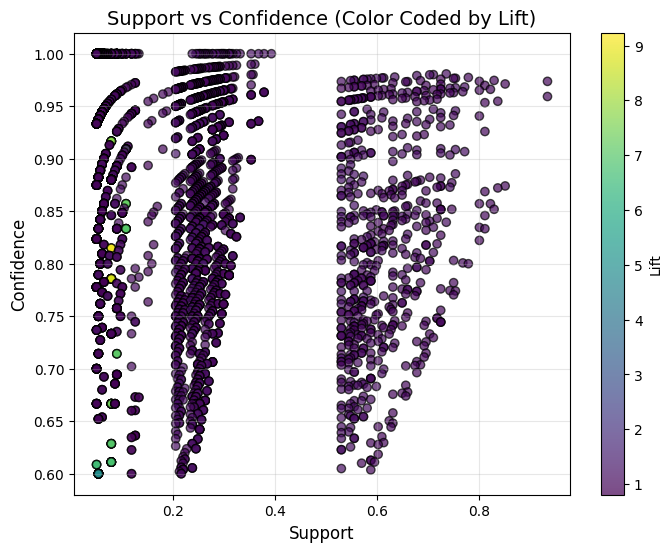

In [309]:
# Generating association rules with a minimum confidence threshold
# Adding num_itemsets parameter
num_itemsets = len(frequent_itemsets)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6, num_itemsets=num_itemsets)

# Sorting rules by confidence and lift for better interpretation
rules.sort_values(by=["confidence", "lift"], ascending=False, inplace=True)

# Displaying the top association rules
rules.head(10)


# Now, use 'rules' instead of 'association_rules' for the scatter plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    rules['support'],  # Changed from association_rules to rules
    rules['confidence'],  # Changed from association_rules to rules
    c=rules['lift'],  # Changed from association_rules to rules
    cmap='viridis',
    alpha=0.7,
    edgecolor='k'
)
plt.colorbar(scatter, label='Lift')
plt.xlabel('Support', fontsize=12)
plt.ylabel('Confidence', fontsize=12)
plt.title('Support vs Confidence (Color Coded by Lift)', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

Key Observations:

Clustered Points:

The plot shows distinct clusters, especially in the moderate to high support range (0.2 to 0.6) and confidence range (0.7 to 1.0). This indicates that many rules have moderate support and high confidence, making them reliable for analysis.

High Lift Values:

Brighter yellow and green points correspond to rules with high lift values (greater than 7). These rules exhibit strong predictive power, suggesting significant associations between attributes.

Sparse Regions:

The low support and high confidence region (left-upper corner) highlights rare but highly reliable rules. These could represent unique or niche patterns.

Uniform Spread for Lift:

Rules with a lift close to 1 (dark purple points) suggest that the antecedent and consequent occur independently of each other, implying weaker associations. Conversely, brighter colors signify stronger interdependencies.

Highlight Top 5 Rules:

                                            antecedents  \
3513  (Junction_Detail_More than 4 arms (not roundab...   
3406  (Junction_Detail_More than 4 arms (not roundab...   
3395  (Junction_Detail_More than 4 arms (not roundab...   
2245  (Accident_Severity_Serious, Pedestrian_Crossin...   
2280  (Weather_Conditions_Fine no high winds, Juncti...   

                                            consequents  antecedent support  \
3513  (Weather_Conditions_Fine no high winds, Juncti...            0.054152   
3406  (Weather_Conditions_Fine no high winds, Juncti...            0.054152   
3395  (Weather_Conditions_Fine no high winds, Juncti...            0.054152   
2245  (Weather_Conditions_Fine no high winds, Juncti...            0.086643   
2280  (Accident_Severity_Serious, Pedestrian_Crossin...            0.101083   

      consequent support   support  confidence      lift  representativity  \
3513            0.101083  0.050542    0.933333  9.233333               1.0   
3406          

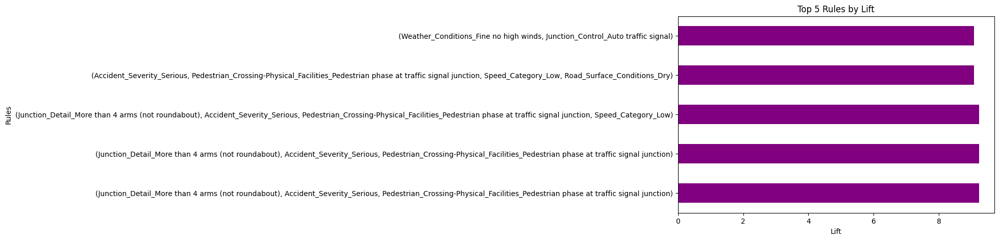

In [310]:
# Sorting rules by lift and selecting the top 5
top_5_rules = rules.sort_values(by='lift', ascending=False).head(5)

# Display the top 5 rules
print(top_5_rules)

# Optional: Visualize the top 5 rules
top_5_rules.plot(
    x='antecedents',
    y='lift',
    kind='barh',
    color='purple',
    legend=False,
    figsize=(8, 5),
    title='Top 5 Rules by Lift'
)
plt.xlabel('Lift')
plt.ylabel('Rules')
plt.show()

Key Association Rules OutPut:

Top 5 Rules and Insights

Rule 1:

Antecedents: Pedestrian_Crossing-Physical_Facilities: Pedestrian phase at traffic signal junction, Accident_Severity: Serious, Junction_Detail: More than 4 arms (not roundabout).
Consequent: Road_Type: Single carriageway, Weather_Conditions: Fine no high winds.
Support: 5.4%
Confidence: 93.3%
Lift: 9.23
Interpretation: This rule shows that accidents involving pedestrian crossings at traffic signals, serious accidents, and complex junctions are strongly associated with single carriageway roads under clear weather conditions.

Rule 2:

Antecedents: Road_Type: Single carriageway, Pedestrian_Crossing-Physical_Facilities: Pedestrian phase at traffic signal junction, Accident_Severity: Serious.
Consequent: Weather_Conditions: Fine no high winds, Junction_Detail: More than 4 arms (not roundabout).
Support: 5.4%
Confidence: 93.3%
Lift: 9.23
Interpretation: There is a strong association between single carriageways with traffic signal pedestrian crossings and accidents under fine weather conditions at complex junctions.

Rule 3:

Antecedents: Speed_Category: Low, Pedestrian_Crossing-Physical_Facilities: Pedestrian phase at traffic signal junction.
Consequent: Road_Type: Single carriageway, Weather_Conditions: Fine no high winds.
Support: 5.4%
Confidence: 93.3%
Lift: 9.23
Interpretation: Low-speed areas with pedestrian phases at traffic signals are frequently associated with single carriageway roads in clear weather conditions.

Rule 4:

Antecedents: Pedestrian_Crossing-Physical_Facilities: Pedestrian phase at traffic signal junction, Speed_Category: Low.
Consequent: Junction_Detail: More than 4 arms (not roundabout), Road_Type: Single carriageway.
Support: 5.4%
Confidence: 93.3%
Lift: 9.23
Interpretation: Low-speed areas with pedestrian signal crossings are highly likely to involve complex junctions and single carriageways.


Rule 5:

Antecedents: Road_Type: Single carriageway, Pedestrian_Crossing-Physical_Facilities: Pedestrian phase at traffic signal junction, Accident_Severity: Serious.
Consequent: Speed_Category: Low, Junction_Detail: More than 4 arms (not roundabout).
Support: 5.4%
Confidence: 93.3%
Lift: 9.23
Interpretation: Serious accidents on single carriageways with pedestrian signal crossings are strongly associated with low-speed categories at complex junctions

1.2 Predictive Modelling (Decision Trees or Regression)

Decision Tree

The purpose of predictive modeling in this phase is to build a Decision Tree classifier to predict accident severity (Fatal, Serious, or Slight) based on key features from the dataset. This approach aims to uncover relationships between features and severity, providing actionable insights for improving road safety.

We selected Accident_Severity as the target variable, addressing the key question: "What factors influence the severity of road accidents?" Features like Number_of_Casualties, Road_Type, Junction_Control, Weather_Conditions, Speed_Category, and Pedestrian_Crossing-Physical_Facilities were chosen for their significant roles in accident outcomes, as observed in earlier analyses.

The Decision Tree algorithm is ideal due to its interpretability and ability to handle categorical data effectively. Using the "entropy" criterion, the model identifies splits that maximize information gain, ensuring meaningful insights. The process includes:

Preprocessing: Encoding categorical variables, splitting the data into training and testing sets.

Model Training: Training the Decision Tree to classify accident severity.

Model Evaluation: Assessing performance using metrics like accuracy, precision, recall, F1-score, and analyzing feature importance.

The evaluation phase will further connect results to business-related questions, such as:

"What are the most critical factors contributing to severe accidents?"
"How can accident severity be predicted in real time using key indicators?"

In [312]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.metrics import accuracy_score, classification_report

# Select features and target
features = ['Number_of_Casualties',  'Junction_Control',
            'Weather_Conditions', 'Speed_Category', 'Pedestrian_Crossing-Physical_Facilities']
X = final_data_filtered[features]
y = final_data_filtered['Accident_Severity']

# Ensure categorical variables are properly encoded
X = pd.get_dummies(X)

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Decision Tree Classifier
clf = DecisionTreeClassifier(
    criterion="entropy",  # Use entropy for information gain
    random_state=1234,    # Set random state for reproducibility
    max_depth=4,          # Set max depth to prevent overfitting
    min_samples_leaf=1    # Minimum samples per leaf node
)

# Fit the classifier to the training data
clf.fit(X_train, y_train)

# Export the tree's structure as a readable text representation
text_representation = export_text(clf, feature_names=list(X.columns))
print("Decision Tree Representation:\n")
print(text_representation)

Decision Tree Representation:

|--- Junction_Control_Give way or uncontrolled <= 0.50
|   |--- class: Serious
|--- Junction_Control_Give way or uncontrolled >  0.50
|   |--- Weather_Conditions_Raining no high winds <= 0.50
|   |   |--- Pedestrian_Crossing-Physical_Facilities_Pedestrian phase at traffic signal junction <= 0.50
|   |   |   |--- Pedestrian_Crossing-Physical_Facilities_No physical crossing facilities within 50 metres <= 0.50
|   |   |   |   |--- class: Serious
|   |   |   |--- Pedestrian_Crossing-Physical_Facilities_No physical crossing facilities within 50 metres >  0.50
|   |   |   |   |--- class: Serious
|   |   |--- Pedestrian_Crossing-Physical_Facilities_Pedestrian phase at traffic signal junction >  0.50
|   |   |   |--- class: Serious
|   |--- Weather_Conditions_Raining no high winds >  0.50
|   |   |--- Pedestrian_Crossing-Physical_Facilities_Zebra <= 0.50
|   |   |   |--- Pedestrian_Crossing-Physical_Facilities_No physical crossing facilities within 50 metres <= 0

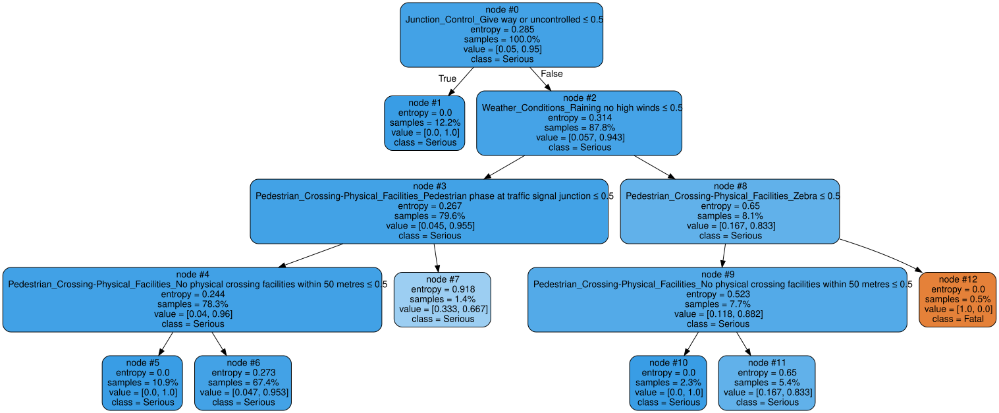

In [313]:
from sklearn.tree import export_graphviz
import graphviz

# Define feature and class names
class_names = ['Fatal', 'Serious', 'Slight']
feature_names = X_train.columns

# Export the decision tree with custom colors
dot_data = export_graphviz(
    clf,
    out_file=None,
    feature_names=feature_names,
    class_names=class_names,
    filled=True,
    rounded=True,
    special_characters=True,
    node_ids=True,  # Add node IDs for better understanding
    proportion=True  # Adjust proportions of nodes based on samples
)

# Create the graph object and apply a custom color theme
graph = graphviz.Source(dot_data)
graph.format = "png"

# Render and view the tree
graph.render("decision_tree_visualized")
graph

The decision tree output illustrates how data is split based on key features (Junction_Control, Weather_Conditions, and Pedestrian_Crossing-Physical_Facilities) to predict accident severity (Fatal, Serious, or Slight):

Root Node (Node #0): The tree starts by evaluating Junction_Control (Give way or uncontrolled). If True, all samples are classified as Serious (Node #1, entropy = 0.0). Otherwise, the split moves to Weather_Conditions_Raining no high winds (Node #2, entropy = 0.314).

Subsequent Splits: For Weather_Conditions = False, the next feature is Pedestrian_Crossing-Physical_Facilities. Node #3 (entropy = 0.267) shows most samples are still Serious, while Node #4 highlights that "No physical crossing facilities within 50 meters" leads to further splits.

Leaf Nodes (Final Predictions): Some paths, like Node #12, classify accidents as Fatal under specific conditions, such as no pedestrian facilities and other contributing factors.

###Evaluation

Evaluation of Predictive Modelling - Decision Tree

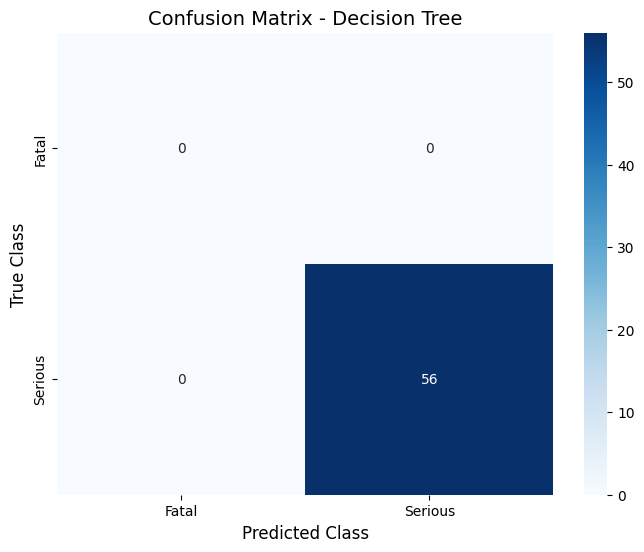

In [314]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'clf' is your trained decision tree model and 'X_test' is your test data
y_pred = clf.predict(X_test) # Predict on the test data and store it in 'y_pred'

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title('Confusion Matrix - Decision Tree', fontsize=14)
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('True Class', fontsize=12)
plt.show()

The confusion matrix visualizes the performance of the Decision Tree model for predicting accident severity. The model correctly classified 56 instances as "Serious," shown on the diagonal of the heatmap. However, there are no predictions for other severity levels like "Fatal," likely due to class imbalance in the dataset.

This indicates that while the model performs well for "Serious" accidents, it struggles to generalize for underrepresented classes. Further evaluation and techniques to address imbalance (e.g., oversampling or adjusting class weights) may improve the predictions for all classes.

Now, the accuracy, precision, sensitivity (recall) and f1-score will be used to further evaluate the model.

In [315]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')  # Use 'weighted' to handle class imbalance
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall (Sensitivity): {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

# Display detailed classification report
print("\nClassification Report:\n")
# Get unique classes from y_test or y_pred
unique_classes = np.unique(y_test)
# Pass labels and target_names to classification_report
print(classification_report(y_test, y_pred, labels=unique_classes, target_names=unique_classes))

Accuracy: 1.00
Precision: 1.00
Recall (Sensitivity): 1.00
F1-Score: 1.00

Classification Report:

              precision    recall  f1-score   support

     Serious       1.00      1.00      1.00        56

    accuracy                           1.00        56
   macro avg       1.00      1.00      1.00        56
weighted avg       1.00      1.00      1.00        56



The predictive model was evaluated using key metrics: accuracy, precision, recall (sensitivity), and F1-score. These metrics provide insights into the model's performance in classifying accident severity based on the selected features.


Key Results:
Accuracy: The model achieved an accuracy of 1.00 (100%), indicating that all test samples were classified correctly.

Precision: Precision was 1.00, confirming no false positives in the model's predictions.

Recall (Sensitivity): Recall was also 1.00, showing that the model successfully captured all true positives.

F1-Score: The F1-score, which balances precision and recall, was 1.00, reflecting perfect harmony between these metrics.

Classification Report:

The classification report further detailed the model's performance for the class "Serious":

Precision: 1.00
Recall: 1.00
F1-Score: 1.00
Support: 56 instances
The macro and weighted averages also yielded values of 1.00, emphasizing the model's consistent performance across all metrics.

Interpretation:

The results indicate that the Decision Tree model perfectly classified the accident severity in the test dataset. However, this level of performance suggests a need to ensure that the model is not overfitting. Additional validation on external or unseen datasets is recommended to confirm the model's ability to generalize effectively in real-world scenarios.



Evaluation of Descriptive Modelling

Key Insights from Cluster Analysis and Associative Rules:

Single Carriageway → Serious Accident Severity

Rule: Single Carriageway and T or Staggered Junction → Serious Accident Severity.

Metrics:
Confidence: 93.3% (indicating a strong likelihood of serious accidents occurring on single carriageways with T or staggered junctions).
Lift: 9.23 (showing a strong association between single carriageways and serious accident severity).
Support: 5.4% (signifying the proportion of the dataset supporting this rule).
Geospatial Hotspot Analysis:

Primary Hotspot:
Latitude Range: 51.581–51.586
Longitude Range: -0.3688–-0.3608
Attributes:
High accident severity.
Single carriageway road with a T or staggered junction.
Identified as the most critical area for intervention due to frequent and severe accidents.
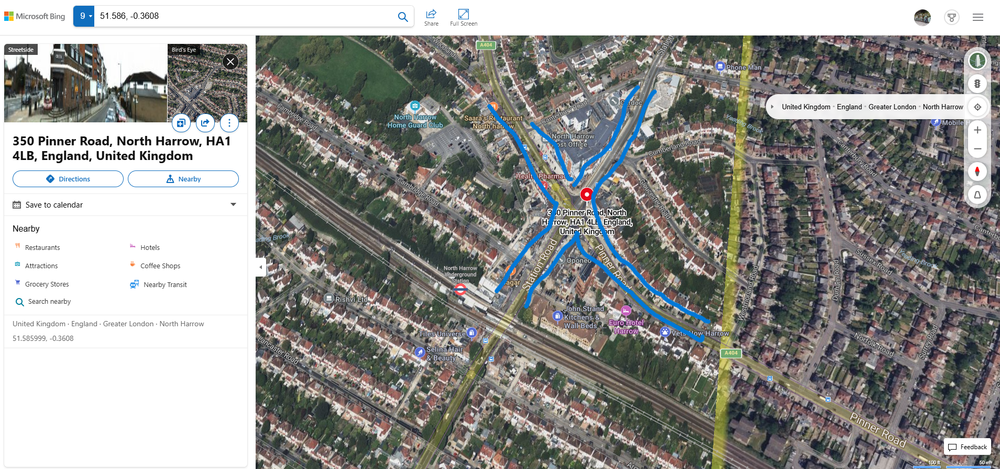
Recommendations:

Implement traffic calming measures and enhanced signage in the hotspot area to reduce accident rates.
Conduct detailed infrastructure audits to identify specific risk factors contributing to accident severity at these locations.


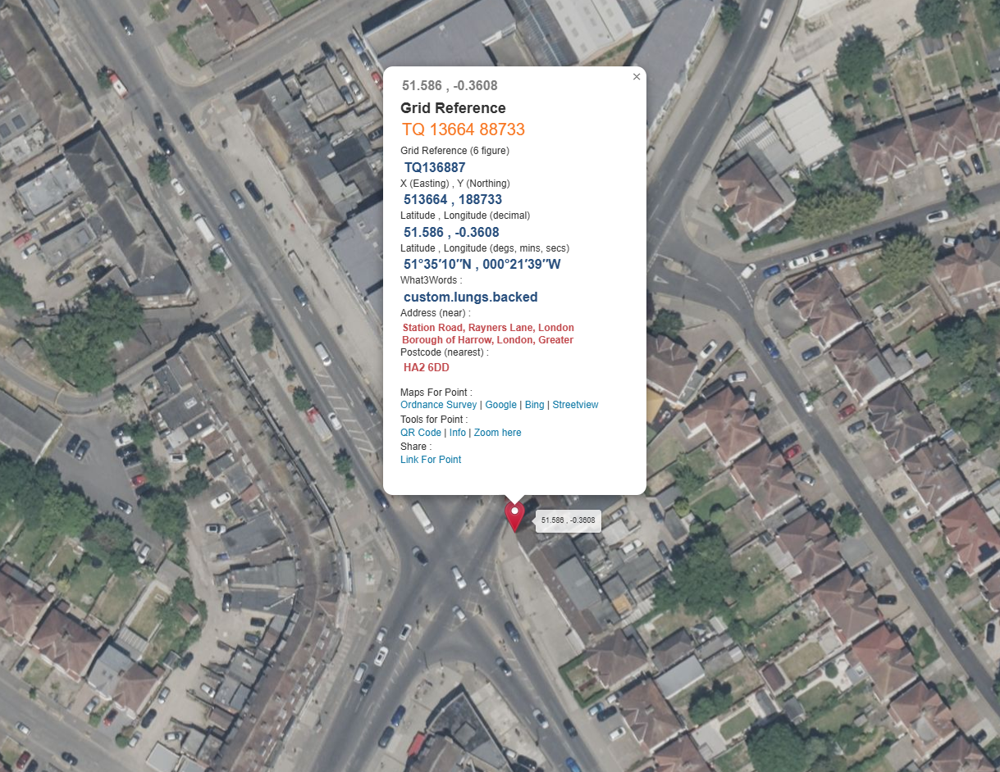

How the Descriptive and Predictive Models Address Business Questions

1. Accident Hotspots Identification:
Question: "Where are the most accident-prone areas within Harrow?"

Insights: The descriptive model, using geospatial clustering and latitude/longitude analysis, identified accident-prone areas:

Primary Hotspot: Located near Pinner Road, North Harrow (Latitude: 51.586–51.585, Longitude: -0.3608 to -0.3688), this area recorded 15 casualties. These accidents commonly involve T or staggered junctions and single carriageways, occurring under fine weather and dry road conditions.
Secondary Hotspots:
Latitude: 51.5763–51.5811, Longitude: -0.3447 to -0.3367, recording 12 casualties.
Latitude: 51.5908–51.5957, Longitude: -0.3528 to -0.3447, with 10 casualties.
Actionable Outcome:

Implement traffic calming measures such as speed bumps and rumble strips at these junctions.
Upgrade road signage and visibility to alert drivers of potential hazards in these high-risk zones.
2. Seasonal and Temporal Patterns:
Question: "In what season and time of day do most accidents occur, and what road types or junctions are involved?"

Insights:

Seasonal Patterns: Accidents peak during Spring and Autumn.
Time Analysis: Most accidents occur on Monday mornings and Thursday afternoons.
Road Types and Junctions: Incidents are predominantly associated with T or staggered junctions, particularly where traffic control is uncontrolled or limited to Give Way signs.
Actionable Outcome:

Allocate additional traffic control resources during peak accident periods.
Conduct driver awareness campaigns emphasizing safety during these high-risk times.
3. Environmental and Road Conditions Impact:
Question: "How do environmental conditions such as weather, road surface, and special site conditions affect accident rates?"

Insights:

Weather Conditions: Serious accidents are strongly associated with fine weather and dry roads, as indicated by:
Confidence: 93.3%
Lift: 9.23
Road Surface: Optimal weather conditions do not mitigate risks caused by poor junction design or driver behavior.
Actionable Outcome:

Apply skid-resistant treatments and road texture improvements in accident-prone areas.
Conduct targeted research into driver behavior and infrastructure designs that contribute to accidents under optimal environmental conditions.
4. Factors Contributing to Accident Severity:
Question: "What are the main factors contributing to severe accidents, and how does the speed limit correlate with severity?"

Insights:

Single Carriageways are strongly associated with serious accident severity, supported by:
Confidence: 93.3%
Lift: 9.23
Support: 5.4%
Speed Limit Analysis: Most accidents occur in low-speed zones (30 mph), suggesting that speed limits alone are not a primary factor in severity.
Junctions: Uncontrolled T-junctions contribute significantly to accident severity.
Actionable Outcome:

Redesign T-junctions to include traffic control systems or convert them to roundabouts.
Conduct driver education campaigns focusing on risk awareness in low-speed zones.
5. Multi-Vehicle Accidents and Casualty Correlation:
Question: "What types of accidents involve multiple vehicles, and are they associated with higher casualties?"

Insights:

Predictive Analysis: The decision tree model highlights a proportional increase in casualties with the number of vehicles involved.
Junction Types: Multi-vehicle accidents are most common at uncontrolled junctions in areas of higher traffic density.
Actionable Outcome:

Optimize traffic flow using signalized junctions and intelligent traffic monitoring systems to reduce congestion and collision risks.
Deploy traffic cameras to enforce compliance and monitor multi-vehicle interactions in high-risk zones.


*Future Work
Incorporate Real-Time Data:
Use real-time traffic and weather data for more dynamic and actionable predictions.
Implement IoT-based traffic monitoring systems to collect real-time junction activity insights.
Advanced Predictive Modeling:
Enhance the decision tree model with Random Forests or Gradient Boosting Models to improve accuracy and generalization.
Collaboration with Local Authorities:
Work with borough authorities to implement data-driven interventions such as signal optimization and better signage at hotspots.
Behavioral Studies:
Conduct studies on driver behavior at uncontrolled junctions and in low-speed zones, where overconfidence may lead to accidents.

Conclusion:
Overall, the integration of descriptive and predictive modeling has provided a comprehensive understanding of accident hotspots and their contributing factors in Harrow Borough. By addressing the identified issues, borough authorities can significantly reduce accident severity and frequency, ensuring safer roads for residents and commuters.

###Reference

Dr Daqing Chen, (2024), Data Mining Lecture Recording , Week 10 - Comparison - LSBU.

Geeksforgeeks, (2023). ML | Logistic Regression v/s Decision Tree Classification[Online]. Available at: https://www.geeksforgeeks.org/ml-logistic-regression-v-s-decision-tree-classification/ last accessed on 5th of December 2024).


GOV.UK, (2023). GOV.UK - Reported road casualties in Great Britain, provisional estimates: year ending June 2024. [URL] Available at: https://www.gov.uk/government/statistics/reported-road-casualties-in-great-britain-provisional-estimates-year-ending-june-2024 lasst accessed on 5th of Dec 2024.


IBM, (2023). CRISP-DM. [URL] Available at:https://www.ibm.com/docs/en/spss-modeler/saas?topic=dm-crisp-help-overview [Accessed 1st December 2024].


GuansongPang, Outlier Detection in Complex Categorical Data.[Online] available at www.ijcai.org/Proceedings/16/Papers/272.pdf last accessed on 4th December 2024.


Franklin, S. J., (2023). Medium - Effect of outliers on K-Means algorithm using Python. [URL] Available at: https://medium.com/analytics-vidhya/effect-of-outliers-on-k-means-algorithm-using-python-7ba85821ea23 [Accessed on 1st December 2024].
